In [1]:
import numpy as np 
import pandas as pd 
import scipy.io
import matplotlib.pyplot as plt
import seaborn as sns
import os
import time
from scipy import signal
from scipy.fft import fft, fftshift
from mne import create_info, EpochsArray
from mne.preprocessing import ICA
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn import preprocessing
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from torchmetrics import Accuracy
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import warnings
from scipy.signal import butter, iirnotch, filtfilt
warnings.filterwarnings("ignore")

## 1. Data processing

In [2]:
folder_path = r"C:\Users\Daniel\OneDrive - VNU-HCMUS\Desktop\Pattern-Recognition\data\EEG Data"
file_paths = []

for dirname, _, filenames in os.walk(folder_path):
    for filename in filenames:
        file_paths.append(os.path.join(dirname, filename))

file_paths

['C:\\Users\\Daniel\\OneDrive - VNU-HCMUS\\Desktop\\Pattern-Recognition\\data\\EEG Data\\eeg_record1.mat',
 'C:\\Users\\Daniel\\OneDrive - VNU-HCMUS\\Desktop\\Pattern-Recognition\\data\\EEG Data\\eeg_record10.mat',
 'C:\\Users\\Daniel\\OneDrive - VNU-HCMUS\\Desktop\\Pattern-Recognition\\data\\EEG Data\\eeg_record11.mat',
 'C:\\Users\\Daniel\\OneDrive - VNU-HCMUS\\Desktop\\Pattern-Recognition\\data\\EEG Data\\eeg_record12.mat',
 'C:\\Users\\Daniel\\OneDrive - VNU-HCMUS\\Desktop\\Pattern-Recognition\\data\\EEG Data\\eeg_record13.mat',
 'C:\\Users\\Daniel\\OneDrive - VNU-HCMUS\\Desktop\\Pattern-Recognition\\data\\EEG Data\\eeg_record14.mat',
 'C:\\Users\\Daniel\\OneDrive - VNU-HCMUS\\Desktop\\Pattern-Recognition\\data\\EEG Data\\eeg_record15.mat',
 'C:\\Users\\Daniel\\OneDrive - VNU-HCMUS\\Desktop\\Pattern-Recognition\\data\\EEG Data\\eeg_record16.mat',
 'C:\\Users\\Daniel\\OneDrive - VNU-HCMUS\\Desktop\\Pattern-Recognition\\data\\EEG Data\\eeg_record17.mat',
 'C:\\Users\\Daniel\\OneDrive

In [3]:
mat = scipy.io.loadmat(file_paths[1])
data = mat['o']['data'][0,0]

column_names = [
    'AF3', 'F7', 'F3', 'FC5','T7', 'P7', 'O1', 'O2', 
    'P8', 'T8', 'FC6', 'F4', 'F8', 'AF4'
]
data_1 = pd.DataFrame(data[:, 3:17], columns=column_names)

In [4]:
data_1.head()

,AF3,F7,F3,FC5,T7,P7,O1,O2,P8,T8,FC6,F4,F8,AF4
0,4435.897436,4027.692308,5087.179487,3826.666667,4035.384615,4404.102564,4366.666667,4125.641026,4217.435897,4308.205128,4142.564103,4283.589744,4334.871795,4158.974359
1,4437.948718,4028.717949,5085.128205,3818.974359,4035.897436,4404.615385,4368.717949,4125.128205,4218.974359,4308.717949,4140.512821,4283.589744,4334.871795,4151.794872
2,4440.512821,4034.871795,5090.256410,3815.384615,4035.384615,4413.846154,4369.743590,4136.923077,4227.179487,4308.717949,4142.564103,4283.589744,4333.846154,4156.923077
3,4441.538462,4028.717949,5088.205128,3820.512821,4034.871795,4405.641026,4367.179487,4131.794872,4220.000000,4308.205128,4143.076923,4283.589744,4334.871795,4155.384615
4,4440.000000,4019.487179,5077.435897,3825.641026,4036.923077,4391.794872,4365.641026,4117.948718,4212.307692,4308.205128,4137.435897,4283.589744,4335.384615,4147.179487


In [5]:
data_1.describe()

,AF3,F7,F3,FC5,T7,P7,O1,O2,P8,T8,FC6,F4,F8,AF4
count,381340.000000,381340.000000,381340.000000,381340.000000,381340.000000,381340.000000,381340.000000,381340.000000,381340.000000,381340.000000,381340.000000,381340.000000,381340.000000,381340.000000
mean,4437.942689,3976.320869,5036.932052,3827.578020,4036.169908,4319.363841,4283.604987,4038.147469,4156.484190,4307.630111,4141.772503,4282.644245,4334.661536,4129.875856
std,2.176525,40.235420,65.638406,2.528549,1.732753,49.621416,67.034060,56.594214,49.979765,2.085118,4.708368,1.130543,1.197543,55.710492
min,4389.230769,3731.282051,4633.846154,3795.384615,4016.410256,3985.641026,3909.743590,3671.794872,3846.153846,4294.358974,3954.358974,4261.538462,4311.282051,3735.897436
25%,4436.410256,3959.487179,5016.923077,3826.153846,4034.871795,4298.461538,4255.897436,4015.384615,4133.846154,4307.179487,4140.512821,4282.051282,4334.358974,4108.717949
50%,4437.948718,3977.435897,5042.051282,3827.692308,4035.897436,4326.153846,4281.538462,4040.512821,4154.358974,4308.205128,4141.538462,4282.564103,4334.871795,4136.410256
75%,4439.487179,3996.923077,5067.179487,3829.230769,4036.923077,4346.666667,4310.769231,4062.564103,4176.410256,4308.205128,4143.076923,4283.076923,4335.384615,4156.410256
max,4490.769231,4280.512821,5943.076923,3838.461538,4053.333333,4586.666667,4695.897436,4386.153846,4475.384615,4342.051282,4372.820513,4304.615385,4350.769231,5043.589744


In [6]:
def plot_column_distributions(df, bins=30, figsize=(12, 8)):
    numeric_columns = df.select_dtypes(include=['number']).columns  
    n_cols = 3  
    n_rows = (len(numeric_columns) + n_cols - 1) // n_cols  

    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize, constrained_layout=True)
    axes = axes.flatten() 
    
    for idx, col in enumerate(numeric_columns):
        sns.histplot(df[col].dropna(), kde=True, bins=bins, ax=axes[idx], color='skyblue')
        axes[idx].set_title(f"Distribution of '{col}'", fontsize=12)
        axes[idx].set_xlabel("Amplitude")
        axes[idx].set_ylabel("Frequency")

    # Ẩn các ô không sử dụng (nếu số cột không chia hết cho n_cols)
    for idx in range(len(numeric_columns), len(axes)):
        axes[idx].axis('off')

    plt.suptitle("Distributions of Numeric Columns", fontsize=16, y=1.02)
    plt.show()


In [ ]:
plot_column_distributions(data_1)

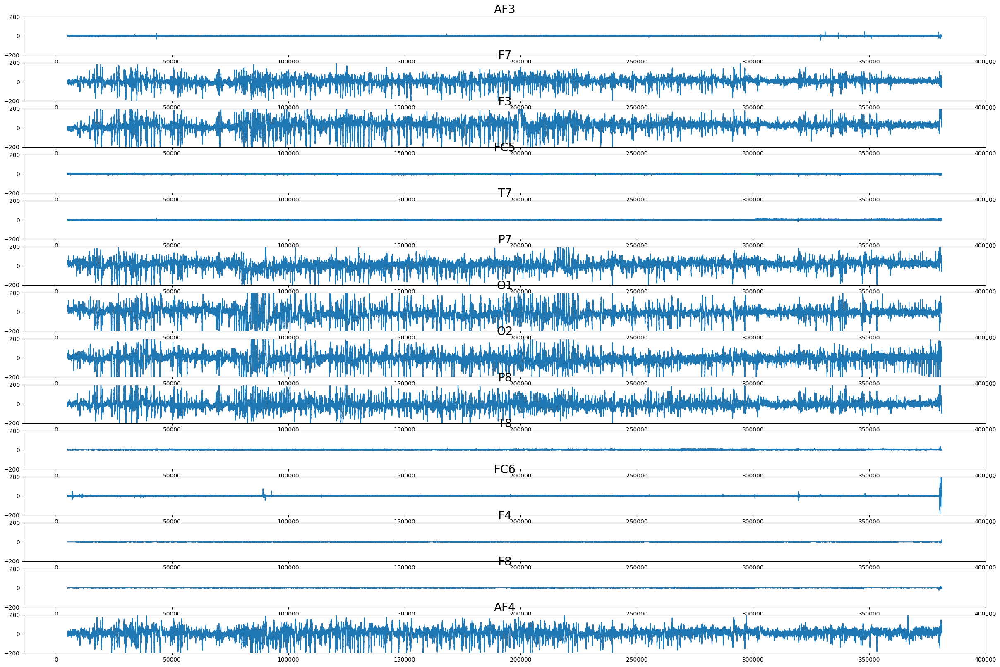

In [ ]:
fig, ax = plt.subplots(14,1)
fig.set_figwidth(20)
fig.set_figheight(50)
fig.set_size_inches(30, 20)
for i in range(14):
    data_ave = data_1.iloc[5000:500000, i] - np.mean(data_1.iloc[5000:50000, i])
    ax[i].plot(data_ave)
    ax[i].set_title(data_1.columns[i], fontsize=20)
    ax[i].set_ylim(-200, 200)

Ta nhận thấy dữ liệu của 7 kênh: F7, F3, P7, O1, O2, P8, AF4 có variance rộng và có sự phân tán nên biên độ giao động sẽ có ảnh hưởng nhiều hơn so với những kênh còn lại. Mà theo như bài báo của tác giả có đề cập: "The acquired data from the 7 leads were identified by F3, F4, Fz, C3, C4, Cz, and Pz.". Hay 7 kênh mà tác giả muốn đề cập là F7, F3, P7, O1, O2, P8, AF4. Vậy nên ta sẽ chọn 7 kênh này và bỏ dữ liệu từ 7 kênh còn lại.

In [ ]:
def load_subject_data(folder_path, subjects, useful_channels):
    all_subject_data = {}  # Dictionary để lưu dữ liệu toàn bộ các đối tượng

    for subject_name, trials in subjects.items():
        subject_data = {}  # Dictionary lưu dữ liệu từng lần thí nghiệm của đối tượng
        for trial_name, file_name in trials.items():
            file_path = os.path.join(folder_path, file_name + '.mat')
            if os.path.exists(file_path):  # Kiểm tra file có tồn tại
                mat = scipy.io.loadmat(file_path)
                data = mat['o']['data'][0, 0]
                
                # Trích xuất dữ liệu các kênh cần thiết
                subject_data[trial_name] = data[:, useful_channels].copy()
            else:
                print(f"File {file_name} không tồn tại.")
        
        # Lưu dữ liệu của đối tượng vào dictionary chính
        all_subject_data[subject_name] = subject_data

    return all_subject_data

def create_subject_objects(*subjects):
    all_subjects = {}
    for i, files in enumerate(subjects, start=1):
        subject_data = {}
        for day, file_name in files.items():
            subject_data[day] = file_name
        all_subjects[f"Subject_{i}"] = subject_data
    return all_subjects


# Dữ liệu của các đối tượng
subj1_files = {'Day_1': 'eeg_record3', 'Day_2': 'eeg_record4', 'Day_3': 'eeg_record5', 
               'Day_4': 'eeg_record6', 'Day_5': 'eeg_record7'}
subj2_files = {'Day_1': 'eeg_record10', 'Day_2': 'eeg_record11', 'Day_3': 'eeg_record12', 
               'Day_4': 'eeg_record13', 'Day_5': 'eeg_record14'}
subj3_files = {'Day_1': 'eeg_record17', 'Day_2': 'eeg_record18', 'Day_3': 'eeg_record19', 
               'Day_4': 'eeg_record20', 'Day_5': 'eeg_record21'}
subj4_files = {'Day_1': 'eeg_record24', 'Day_2': 'eeg_record25', 'Day_3': 'eeg_record26', 
               'Day_4': 'eeg_record27', 'Day_5': 'eeg_record28'}
subj5_files = {'Day_1': 'eeg_record31', 'Day_2': 'eeg_record32', 'Day_3': 'eeg_record33', 
               'Day_4': 'eeg_record34'}

# Tạo các đối tượng
subjects = create_subject_objects(subj1_files, subj2_files, subj3_files, subj4_files, subj5_files)

# Danh sách các kênh cần trích xuất
useful_channels = np.array([1, 2, 5, 6, 7, 8, 13]) + 3

# Gọi hàm load dữ liệu
all_subject_data = load_subject_data(folder_path, subjects, useful_channels)

# Kiểm tra dữ liệu
for subject, trials in all_subject_data.items():
    print(f"{subject}:")
    for trial, data in trials.items():
        print(f"  {trial}: {data.shape}")


Subject_1:
  Day_1: (357224, 7)
  Day_2: (380344, 7)
  Day_3: (351204, 7)
  Day_4: (288752, 7)
  Day_5: (398816, 7)
Subject_2:
  Day_1: (381340, 7)
  Day_2: (391624, 7)
  Day_3: (356728, 7)
  Day_4: (373304, 7)
  Day_5: (345164, 7)
Subject_3:
  Day_1: (443972, 7)
  Day_2: (361840, 7)
  Day_3: (333236, 7)
  Day_4: (396812, 7)
  Day_5: (336280, 7)
Subject_4:
  Day_1: (360928, 7)
  Day_2: (415164, 7)
  Day_3: (363232, 7)
  Day_4: (347548, 7)
  Day_5: (214540, 7)
Subject_5:
  Day_1: (428848, 7)
  Day_2: (483732, 7)
  Day_3: (483376, 7)
  Day_4: (408976, 7)


In [ ]:
all_subject_data['Subject_1']['Day_1'].shape

(357224, 7)

Môi tập dữ liệu là một bản ghi lại tín hiệu sóng não thông qua quá trình thử nghiệm lái tàu mô phỏng trên máy tính có tên là "Microsoft Train Simulator". Với 5 người tham gia, mỗi file sẽ kéo dài trong khoảng 35-55 phút, mỗi người chơi thực hiện 7 lần thử nghiệm.

Trong 10 phút đầu người chơi duy trì trạng thái tập trung, ở 10 phút tiếp theo thì người chơi sẽ vào trạng thái không tập trung, và thời gian còn lại sẽ rơi vào trạng thái buồn ngủ.

Trong bản ghi tác giả có nói 2 bản ghi đầu của mỗi đối tượng sẽ để làm quen nên ta sẽ chỉ lấy 5 bản ghi cuối cùng của mỗi người tham gia, và người thứ 5 sẽ không được ghi lại ở bản ghi thứ 7

Dựa vào những cung cấp trên của bài báo thì ta có thể chia dữ liệu thành 10 phút đầu là trạng thái tập trung(focus), 10 phút tiếp theo là trạng thái không tập trung(unfocus) và thời gian còn lại là trạng thái buông ngủ(drowsy) nhưng do ta cần cân bằng về mặt label cho việc dự đoán nên ta sẽ chọn mốc thời gian cuối dùng là từ phút 20 đến phút 30.

Ta cần kiểm tra xem dữ liệu trong từng ngày kiểm tra có đủ tối thiểu 30 phút hay không

In [ ]:

def check_days_with_insufficient_time(subject_data, freq_sample=128, min_time=30):
    result = {}
    
    for subject, days in subject_data.items():
        insufficient_days = []  
        for day, data in days.items():
            samples = data.shape[0]  
            time_in_minutes = samples / (freq_sample * 60)  
            
            # Kiểm tra nếu không đủ thời gian
            if time_in_minutes < min_time:
                insufficient_days.append((day, time_in_minutes))  
        
        if insufficient_days:
            result[subject] = insufficient_days  
    return result


def drop_insufficient_days(subject_data, insufficient_days_result):
    updated_data = {}

    for subject, days in subject_data.items():
        # Lấy danh sách các ngày không đủ thời gian cho subject này
        insufficient_days = [day for day, _ in insufficient_days_result.get(subject, [])]
        
        # Lấy các ngày hợp lệ (không có trong insufficient_days)
        valid_days = {day: data for day, data in days.items() if day not in insufficient_days}
        
        # Cập nhật subject mới với các ngày hợp lệ
        updated_data[subject] = valid_days
    
    return updated_data

In [ ]:

result = check_days_with_insufficient_time(all_subject_data)
print(result)

{'Subject_4': [('Day_5', 27.934895833333332)]}


In [ ]:
all_subject_data = drop_insufficient_days(all_subject_data, result)

In [ ]:
# Kiểm tra dữ liệu
for subject, trials in all_subject_data.items():
    print(f"{subject}:")
    for trial, data in trials.items():
        print(f"  {trial}: {data.shape}")

Subject_1:
  Day_1: (357224, 7)
  Day_2: (380344, 7)
  Day_3: (351204, 7)
  Day_4: (288752, 7)
  Day_5: (398816, 7)
Subject_2:
  Day_1: (381340, 7)
  Day_2: (391624, 7)
  Day_3: (356728, 7)
  Day_4: (373304, 7)
  Day_5: (345164, 7)
Subject_3:
  Day_1: (443972, 7)
  Day_2: (361840, 7)
  Day_3: (333236, 7)
  Day_4: (396812, 7)
  Day_5: (336280, 7)
Subject_4:
  Day_1: (360928, 7)
  Day_2: (415164, 7)
  Day_3: (363232, 7)
  Day_4: (347548, 7)
Subject_5:
  Day_1: (428848, 7)
  Day_2: (483732, 7)
  Day_3: (483376, 7)
  Day_4: (408976, 7)


In [ ]:
import numpy as np
from scipy.signal import butter, filtfilt, iirnotch

def combined_filter(data, fs=128):
    """
    Áp dụng bộ lọc band-pass từ 0.5Hz đến 40Hz và bộ lọc Notch tại 50Hz.
    
    Parameters:
        data (ndarray): Dữ liệu EEG cần lọc.
        fs (int): Tần số lấy mẫu (Hz), mặc định là 128.
    
    Returns:
        ndarray: Dữ liệu đã được lọc.
    """
    nyquist = fs / 2
    low = 0.5 / nyquist
    high = 40 / nyquist
    b_band, a_band = butter(6, [low, high], btype='band')
    
    # Thiết kế bộ lọc Notch tại 50Hz
    notch_freq = 50  # tần số nguồn điện
    quality_factor = 10  # độ rộng của bộ lọc
    b_notch, a_notch = iirnotch(notch_freq, quality_factor, fs)
    
    # Áp dụng bộ lọc band-pass
    bandpass_filtered = filtfilt(b_band, a_band, data)
    
    # Áp dụng bộ lọc Notch
    filtered_signal = filtfilt(b_notch, a_notch, bandpass_filtered)
    
    return filtered_signal

def filter_subject_data(subject_data, fs=128):
    """
    Lọc dữ liệu cho tất cả các đối tượng và các ngày thí nghiệm.

    Parameters:
        subject_data (dict): Dữ liệu của các đối tượng và các lần thí nghiệm.
        fs (int): Tần số lấy mẫu (Hz), mặc định là 128.

    Returns:
        dict: Dữ liệu đã lọc cho các đối tượng.
    """
    filtered_data = {}

    # Duyệt qua tất cả các đối tượng
    for subject_name, trials in subject_data.items():
        subject_filtered = {}
        
        # Duyệt qua các ngày thí nghiệm của đối tượng
        for trial_name, data in trials.items():
            # Lọc dữ liệu của từng ngày thí nghiệm
            subject_filtered[trial_name] = np.apply_along_axis(combined_filter, axis=0, arr=data, fs=fs)
        
        # Lưu dữ liệu đã lọc của đối tượng
        filtered_data[subject_name] = subject_filtered

    return filtered_data

# Áp dụng lọc dữ liệu cho các đối tượng
filtered_all_subject_data = filter_subject_data(all_subject_data, fs=128)

In [ ]:
channel_names = [
    'F7', 'F3', 'P7', 'O1', 'O2', 'P8', 'AF4'
]

In [ ]:
def analyze_data(all_subject_data, filtered_all_subject_data, num_subjects=2, num_days=1, fs=128):
    """
    Vẽ biểu đồ tín hiệu EEG trước và sau khi lọc cho các đối tượng trong từng ngày thí nghiệm.
    
    Parameters:
    - all_subject_data: Dữ liệu thô của tất cả các đối tượng
    - filtered_all_subject_data: Dữ liệu đã lọc của tất cả các đối tượng
    - num_subjects: Số lượng đối tượng cần phân tích (mặc định là 2)
    - num_days: Số lượng ngày thí nghiệm cần phân tích (mặc định là 1)
    - fs: Tần số lấy mẫu
    """
    subjects = list(all_subject_data.keys())[:num_subjects]  # Lấy một số đối tượng cần phân tích
    
    for subject in subjects:
        subject_data = all_subject_data[subject]
        subject_filtered_data = filtered_all_subject_data[subject]
        
        # Duyệt qua các ngày thí nghiệm
        days = list(subject_data.keys())[:num_days]  # Lấy số ngày cần phân tích
        for day in days:
            raw_data = subject_data[day]
            filtered_data = subject_filtered_data[day]

            # Vẽ biểu đồ tín hiệu gốc
            plt.figure(figsize=(15, 10))
            plt.subplot(2, 1, 1)
            plt.plot(raw_data[1000:2000, :])  # Vẽ 500 mẫu đầu tiên của dữ liệu
            plt.title(f"Raw EEG Data - {subject} - {day}")
            plt.xlabel("Sample")
            plt.ylabel("Amplitude")
            plt.legend(channel_names)
            plt.grid(True)

            # Vẽ biểu đồ tín hiệu đã lọc
            plt.subplot(2, 1, 2)
            plt.plot(filtered_data[1000:2000, :])  # Vẽ 500 mẫu đầu tiên của dữ liệu đã lọc
            plt.title(f"Filtered EEG Data - {subject} - {day}")
            plt.xlabel("Sample")
            plt.ylabel("Amplitude")
            plt.legend(channel_names)
            plt.grid(True)

            plt.tight_layout()
            plt.show()



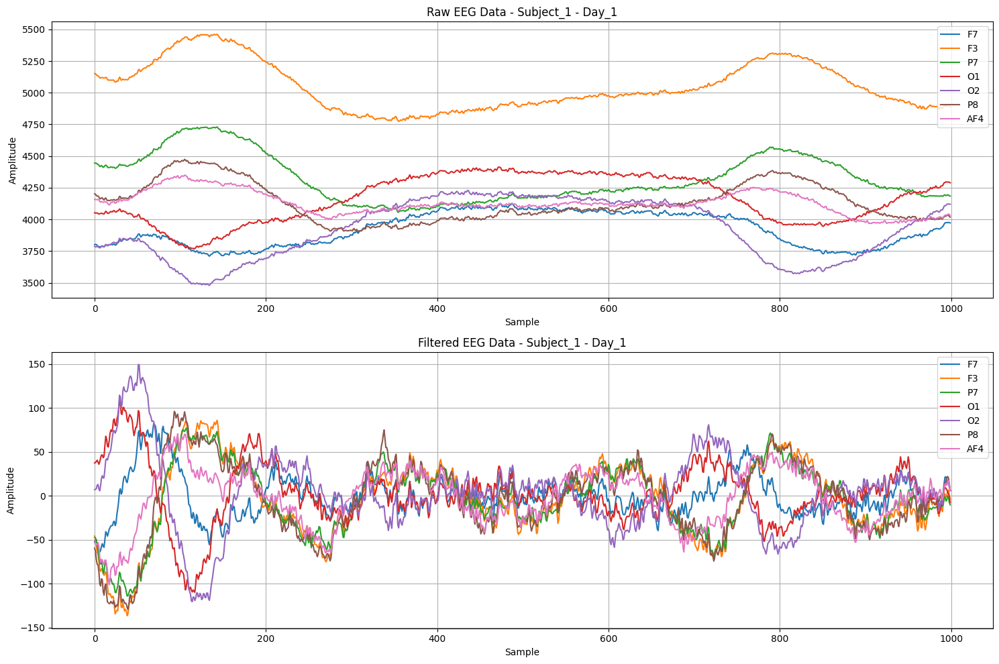

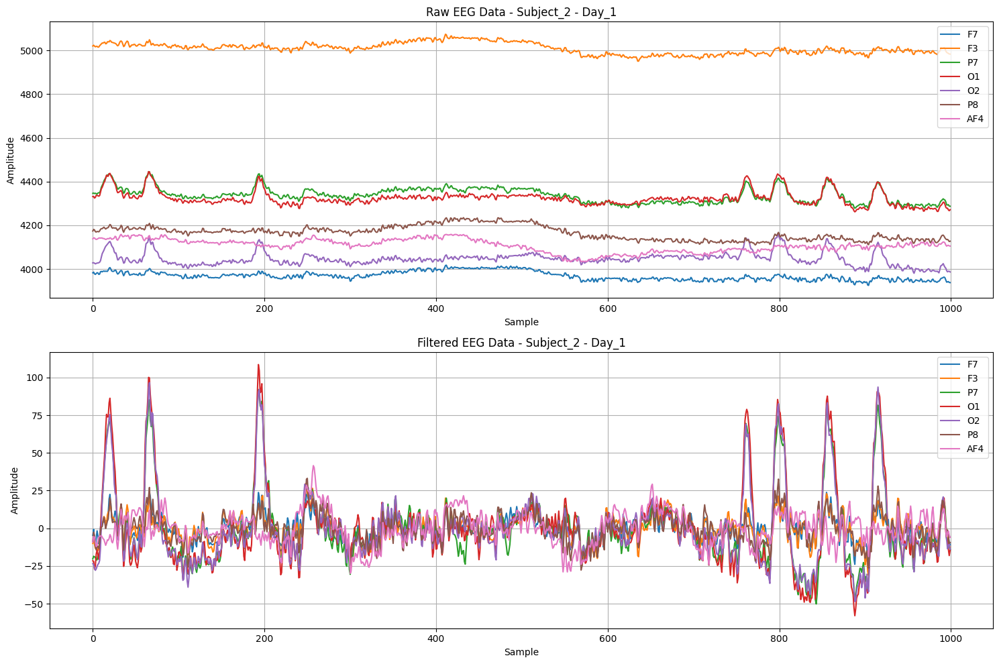

In [ ]:
# Áp dụng phân tích và vẽ biểu đồ cho các đối tượng và các ngày thí nghiệm
analyze_data(all_subject_data, filtered_all_subject_data, num_subjects=2, num_days=1, fs=128)

## Apply ICA

In [ ]:
import mne
from mne.preprocessing import ICA

def apply_ica(filtered_all_subject_data, channel_names):
    ica_list = {}  # Lưu ICA cho từng đối tượng
    raw_list = {}  # Lưu Raw cho từng đối tượng

    # Duyệt qua từng đối tượng trong all_subject_data
    for subject_name, subject_data in filtered_all_subject_data.items():
        ica_list[subject_name] = []
        raw_list[subject_name] = []

        # Duyệt qua các ngày thí nghiệm của từng đối tượng
        for day, data_one_day in subject_data.items():
            sfreq = 128 
            info = mne.create_info(ch_names=channel_names, sfreq=sfreq, ch_types='eeg')
            filtered_data_mne = data_one_day.T  

            # Tạo đối tượng Raw từ dữ liệu
            raw = mne.io.RawArray(filtered_data_mne, info)

            # Thêm montage(vị tri điện cực chuẩn) vào đối tượng Raw với montage 'standard_1020'
            montage = mne.channels.make_standard_montage('standard_1020')
            raw.set_montage(montage)

            # Áp dụng ICA để tách các thành phần độc lập
            ica = ICA(n_components=7, random_state=42, max_iter='auto')
            ica.fit(raw)
            
            ica_list[subject_name].append(ica)
            raw_list[subject_name].append(raw)

    return ica_list, raw_list

# Giả sử filtered_all_subject_data là dữ liệu đã lọc của tất cả các đối tượng
ica_list, raw_list = apply_ica(filtered_all_subject_data, channel_names)


Creating RawArray with float64 data, n_channels=7, n_times=357224
    Range : 0 ... 357223 =      0.000 ...  2790.805 secs
Ready.
Fitting ICA to data using 7 channels (please be patient, this may take a while)
Selecting by number: 7 components
Fitting ICA took 1.3s.
Creating RawArray with float64 data, n_channels=7, n_times=380344
    Range : 0 ... 380343 =      0.000 ...  2971.430 secs
Ready.
Fitting ICA to data using 7 channels (please be patient, this may take a while)
Selecting by number: 7 components
Fitting ICA took 2.6s.
Creating RawArray with float64 data, n_channels=7, n_times=351204
    Range : 0 ... 351203 =      0.000 ...  2743.773 secs
Ready.
Fitting ICA to data using 7 channels (please be patient, this may take a while)
Selecting by number: 7 components
Fitting ICA took 2.5s.
Creating RawArray with float64 data, n_channels=7, n_times=288752
    Range : 0 ... 288751 =      0.000 ...  2255.867 secs
Ready.
Fitting ICA to data using 7 channels (please be patient, this may tak

In [ ]:
raw_list['Subject_1'][2].info

<Info | 8 non-empty values
 bads: []
 ch_names: F7, F3, P7, O1, O2, P8, AF4
 chs: 7 EEG
 custom_ref_applied: False
 dig: 10 items (3 Cardinal, 7 EEG)
 highpass: 0.0 Hz
 lowpass: 64.0 Hz
 meas_date: unspecified
 nchan: 7
 projs: []
 sfreq: 128.0 Hz
>

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 16.000 (s)
Plotting power spectral density (dB=True).


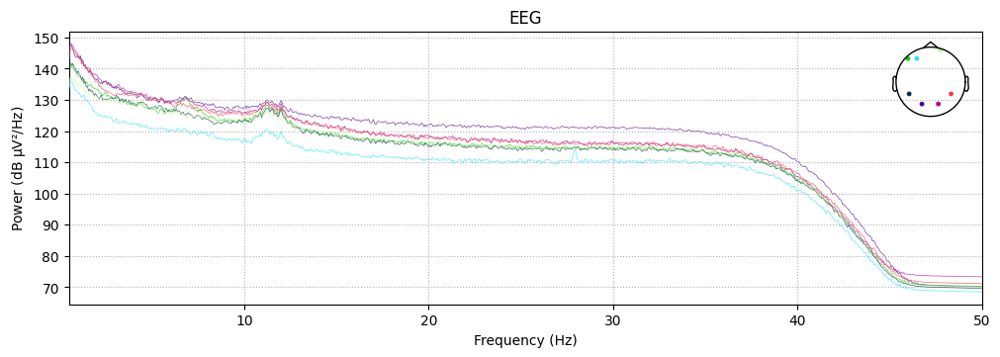

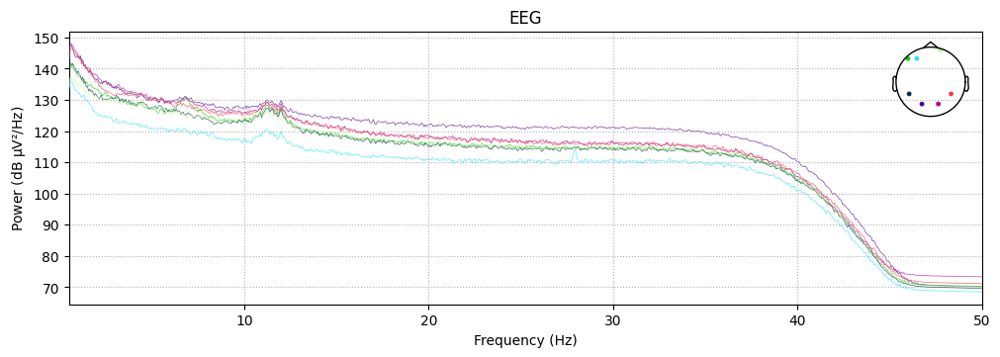

In [ ]:
raw_list['Subject_1'][2].plot_psd(fmin=0.5, fmax=50, average=False)

In [ ]:
ica_list['Subject_1'][1]

Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=1000
Fit,35 iterations on raw data (380344 samples)
ICA components,7
Available PCA components,7
Channel types,eeg
ICA components marked for exclusion,—


In [ ]:
def plot_ica_components_and_sources(subject_name, start_day, end_day, ica_list, raw_list):
    """
    Vẽ các thành phần ICA và tín hiệu nguồn cho một đối tượng (subject) cụ thể

    Parameters:
    - subject_name: str, tên của đối tượng cần vẽ.
    - start_day: int, ngày bắt đầu (chỉ số ngày, bắt đầu từ 0).
    - end_day: int, ngày kết thúc (chỉ số ngày, bắt đầu từ 0).
    - ica_list: dict, danh sách các đối tượng ICA theo từng subject.
    - raw_list: dict, danh sách các đối tượng Raw theo từng subject.
    """
    # Kiểm tra xem subject_name có tồn tại trong ica_list và raw_list không
    if subject_name not in ica_list or subject_name not in raw_list:
        print(f"Subject {subject_name} không tồn tại trong danh sách ICA hoặc Raw.")
        return

    # Lặp qua các ngày trong khoảng start_day đến end_day
    for day_idx in range(start_day, end_day + 1):
        ica = ica_list[subject_name][day_idx]
        raw = raw_list[subject_name][day_idx]
        
        print(f"Subject {subject_name}, Day {day_idx + 1}")
        
        # Vẽ tín hiệu nguồn
        ica.plot_sources(raw, start=0, stop=30)
        
        # Vẽ các thành phần ICA
        ica.plot_components(outlines='head')

Subject Subject_2, Day 1
Creating RawArray with float64 data, n_channels=7, n_times=381340
    Range : 0 ... 381339 =      0.000 ...  2979.211 secs
Ready.
Using matplotlib as 2D backend.


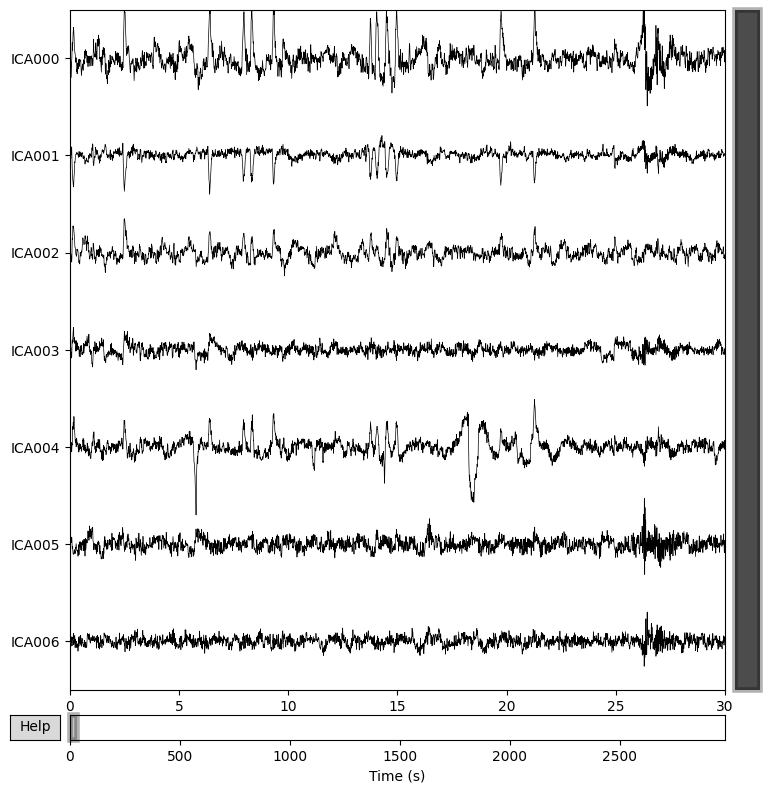

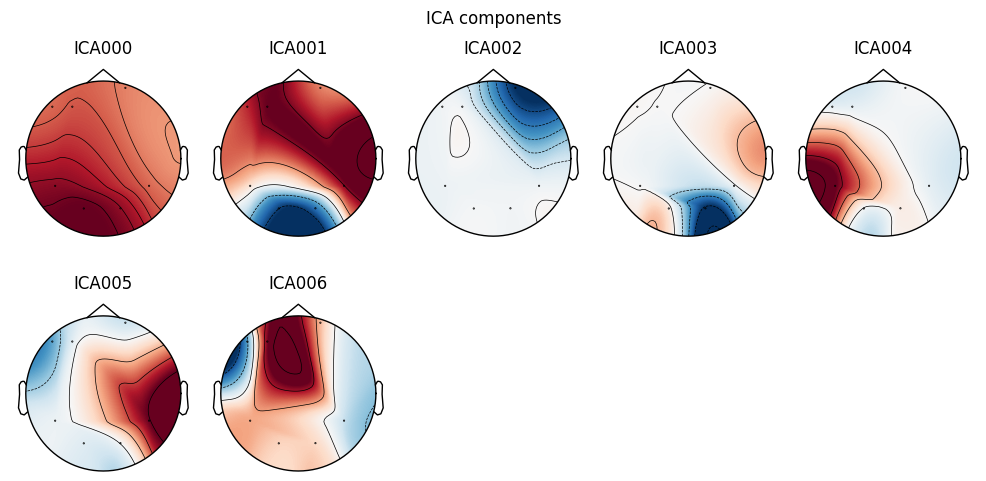

Subject Subject_2, Day 2
Creating RawArray with float64 data, n_channels=7, n_times=391624
    Range : 0 ... 391623 =      0.000 ...  3059.555 secs
Ready.


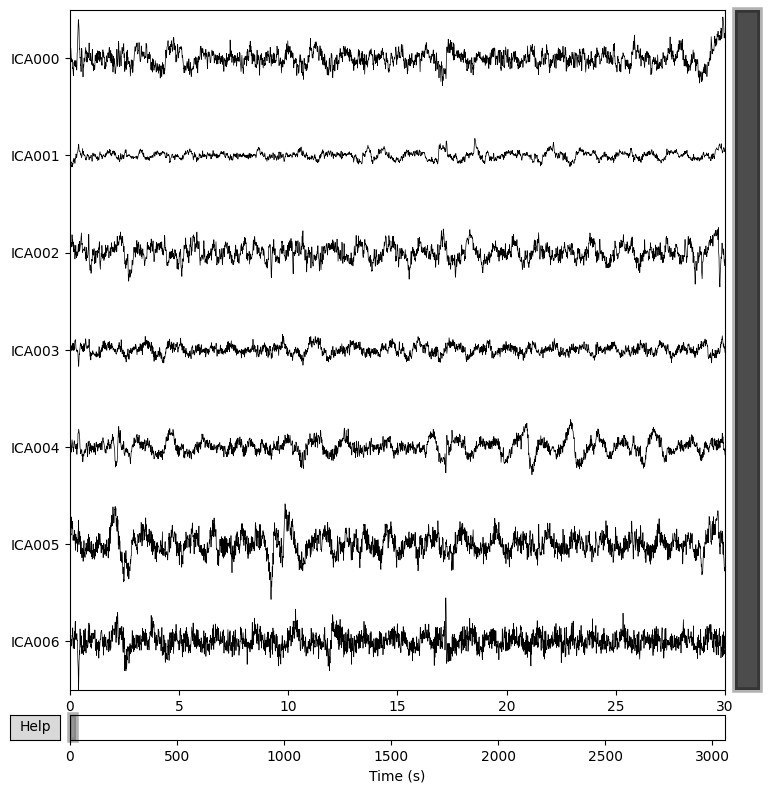

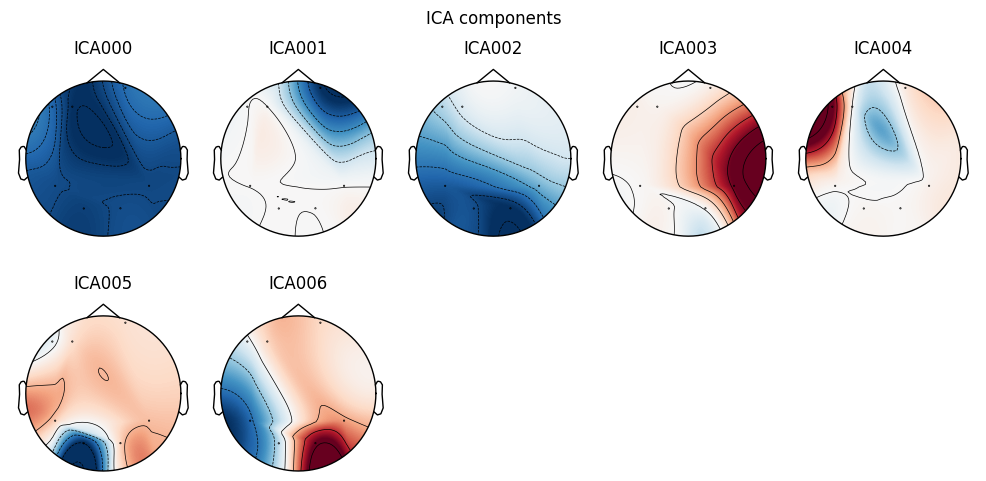

Subject Subject_2, Day 3
Creating RawArray with float64 data, n_channels=7, n_times=356728
    Range : 0 ... 356727 =      0.000 ...  2786.930 secs
Ready.


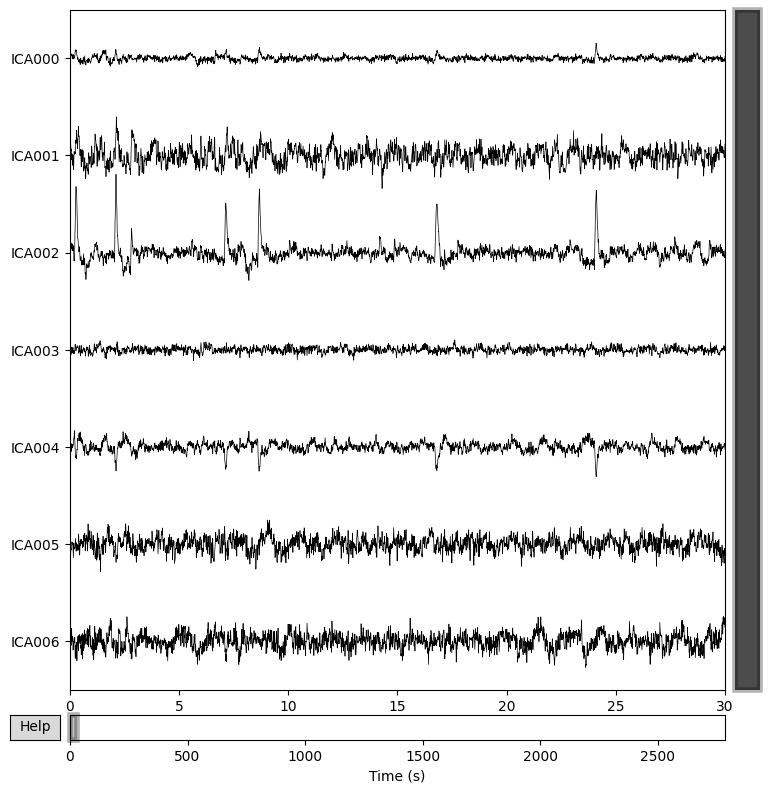

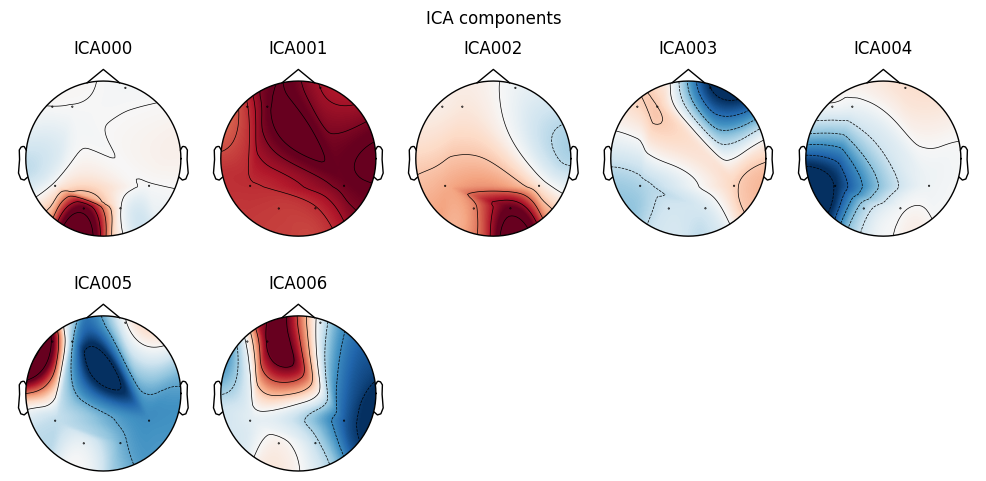

Subject Subject_2, Day 4
Creating RawArray with float64 data, n_channels=7, n_times=373304
    Range : 0 ... 373303 =      0.000 ...  2916.430 secs
Ready.


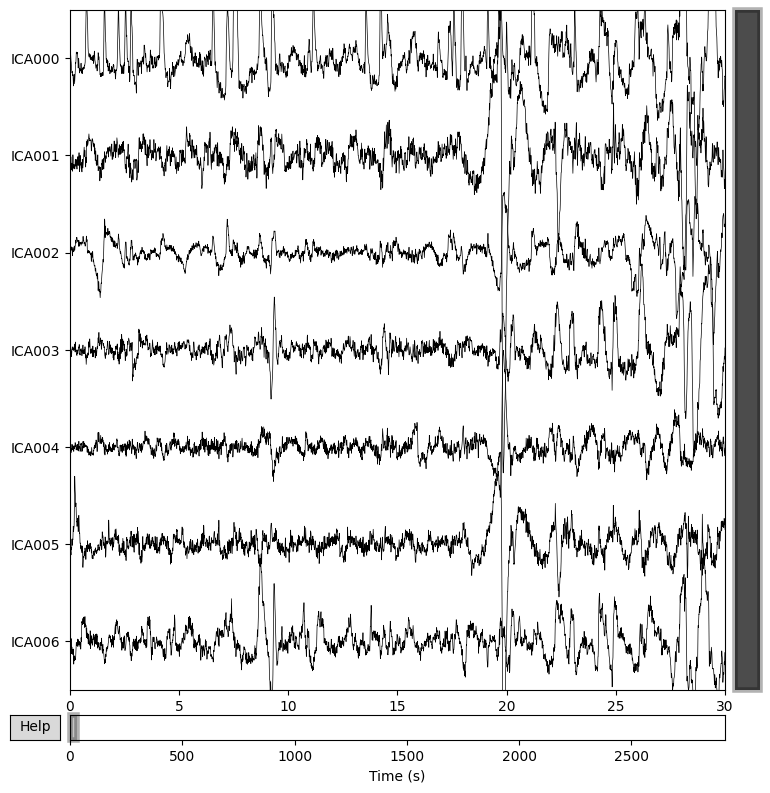

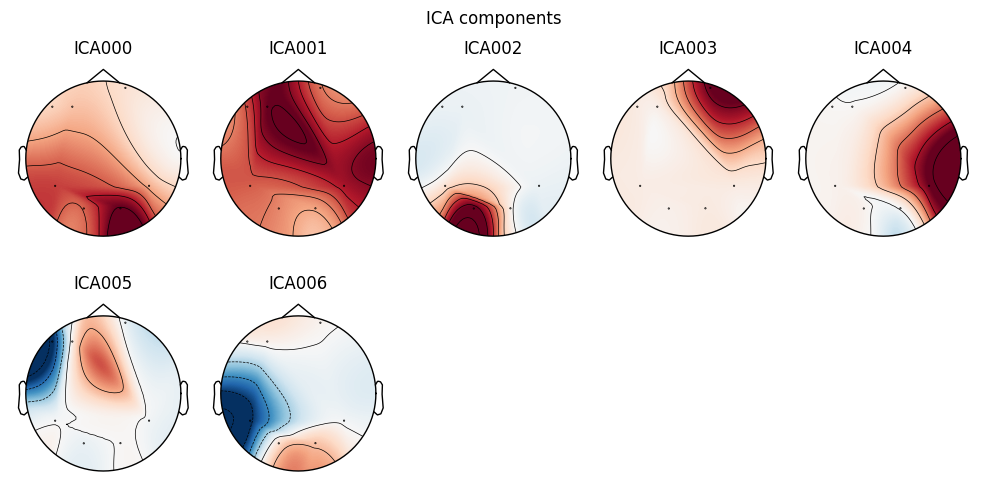

Subject Subject_2, Day 5
Creating RawArray with float64 data, n_channels=7, n_times=345164
    Range : 0 ... 345163 =      0.000 ...  2696.586 secs
Ready.


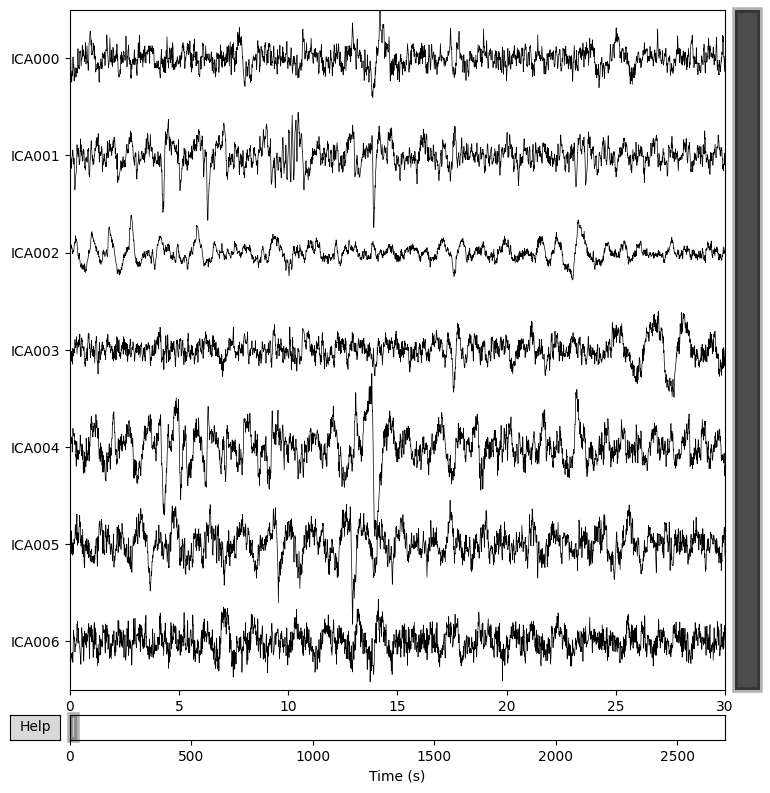

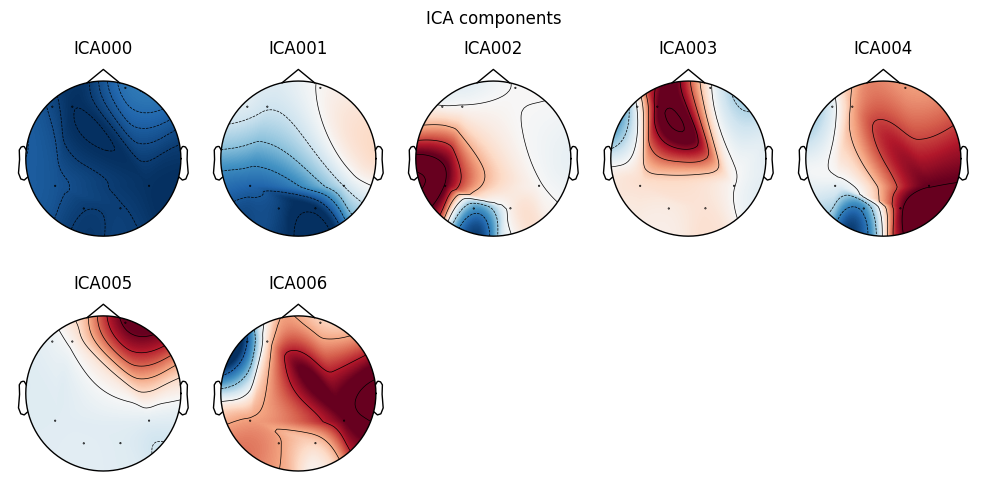

In [ ]:
# Vẽ cho Subject_1 từ ngày 1 đến ngày 3
plot_ica_components_and_sources('Subject_2', 0, 4, ica_list, raw_list)

In [ ]:
channel_names

['F7', 'F3', 'P7', 'O1', 'O2', 'P8', 'AF4']

In [ ]:
eye_channels = ['F7', 'F3', 'AF4']  # Kênh EOG
heart_channels = ['P7', 'P8', 'O1', 'O2']  # Kênh ECG

Using EOG channels: F7, F3, AF4
EOG channel index for this subject is: [0 1 6]
Filtering the data to remove DC offset to help distinguish blinks from saccades
Selecting channel F7 for blink detection
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1280 samples (10.000 s)

Now detecting blinks and generating corresponding events
Found 3 significant peaks
Number of EOG events detected: 3
Not setting metadata
3 matching events found
No baseline correction applied
Using data from preloaded Raw for 3 events and 129 original time points ...
0 bad epochs dropped
Applying baseline correcti

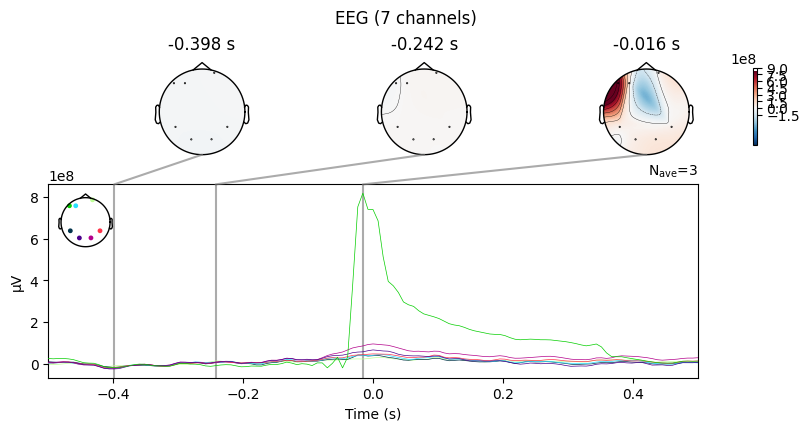

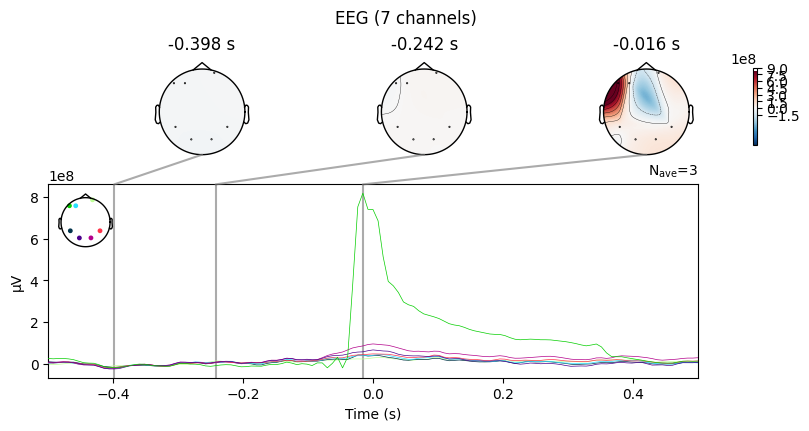

In [ ]:
from mne.preprocessing import create_eog_epochs


# Specify the subject and day
subject = 'Subject_1'
day = 1

# Get the raw object
raw = raw_list[subject][day]

# Create EOG epochs and plot
eog_evoked = create_eog_epochs(raw, ch_name=eye_channels).average()
eog_evoked.apply_baseline(baseline=(None, -0.2))
eog_evoked.plot_joint()

In [ ]:
eye_channels = ['F7', 'AF4']  # Kênh EOG
heart_channels = ['P7']  # Kênh ECG
threshold_ecg = 0.5  # Define the threshold for ECG

def detect_noisy_components(ica_list, raw_list, threshold_eog=3.0, threshold_ecg=0.5):
    exclude_components_dict = {}

    for subject, ica_subject in ica_list.items():
        exclude_components_dict[subject] = {}
        for day_idx, ica in enumerate(ica_subject):
            raw = raw_list[subject][day_idx]

            # Phát hiện các thành phần liên quan đến EOG
            eog_indices, _ = ica.find_bads_eog(raw, threshold=threshold_eog, ch_name=eye_channels)
            print(f"Subject {subject}, Day {day_idx + 1} - EOG components: {eog_indices}")

            # Phát hiện các thành phần liên quan đến ECG
            ecg_indices = []
            for heart_channel in heart_channels:
                if heart_channel in raw.info['ch_names']:
                    ecg_idx, _ = ica.find_bads_ecg(raw, threshold=threshold_ecg, ch_name=heart_channel)
                    ecg_indices.extend(ecg_idx)
            ecg_indices = list(set(ecg_indices))  # Loại bỏ trùng lặp
            print(f"Subject {subject}, Day {day_idx + 1} - ECG components: {ecg_indices}")

            # Gộp các thành phần bị loại bỏ (EOG + ECG)
            exclude_indices = list(set(eog_indices + ecg_indices))
            exclude_components_dict[subject][day_idx] = exclude_indices

            # Đánh dấu các thành phần bị loại bỏ
            ica.exclude = exclude_indices

    return exclude_components_dict


In [ ]:
# Detect noisy components
exclude_components_dict = detect_noisy_components(ica_list, raw_list)

Using EOG channels: F7, AF4
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1280 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 H

In [ ]:
def apply_ica_and_clean_data(ica_list, raw_list, exclude_components_dict):
    cleaned_raw_list = {}

    for subject, ica_subject in ica_list.items():
        cleaned_raw_list[subject] = []
        for day_idx, ica in enumerate(ica_subject):
            raw = raw_list[subject][day_idx]

            # Lấy danh sách các thành phần cần loại bỏ từ exclude_components_dict
            exclude_components = exclude_components_dict[subject].get(day_idx, [])
            
            # Đánh dấu các thành phần nhiễu để loại bỏ
            ica.exclude = exclude_components

            # Áp dụng ICA để loại bỏ các thành phần nhiễu
            raw_cleaned = ica.apply(raw.copy())  

            cleaned_raw_list[subject].append(raw_cleaned)

    return cleaned_raw_list


In [ ]:
cleaned_raw_list = apply_ica_and_clean_data(ica_list, raw_list, exclude_components_dict)

Applying ICA to Raw instance


    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back us

In [ ]:
def store_cleaned_data_as_filtered_dict(cleaned_raw_list):
    """
    Lưu dữ liệu đã làm sạch vào dict mới với cấu trúc filtered_all_subject_data.

    Parameters:
    - cleaned_raw_list: dict, danh sách các đối tượng Raw sau khi đã loại bỏ nhiễu.

    Returns:
    - filtered_all_subject_data: dict, cấu trúc dữ liệu sạch theo subject và ngày.
    """
    eeg_data_ica_filterd = {}

    for subject, raw_subject in cleaned_raw_list.items():
        eeg_data_ica_filterd[subject] = {}

        for day_idx, raw_data in enumerate(raw_subject):
            day_key = f"Day_{day_idx + 1}" 
            data_array = raw_data.get_data()
            eeg_data_ica_filterd[subject][day_key] = data_array

    return eeg_data_ica_filterd

# Lưu dữ liệu sạch vào dict mới
eeg_data_ica_filterd = store_cleaned_data_as_filtered_dict(cleaned_raw_list)


In [ ]:
eeg_data_ica_filterd['Subject_1']['Day_1'].shape

(7, 357224)

In [ ]:
def split_data_by_state(subject_data, focus_duration=10, unfocus_duration=10, sfreq=128):
    focus_samples = focus_duration * 60 * sfreq  # Số mẫu trong 10 phút
    unfocus_samples = unfocus_duration * 60 * sfreq  # Số mẫu trong 10 phút
    
    split_data = {'focus': {}, 'unfocus': {}, 'drowsy': {}}
    
    for subject, days_data in subject_data.items():
        split_data['focus'][subject] = {}
        split_data['unfocus'][subject] = {}
        split_data['drowsy'][subject] = {}
        
        for day, data in days_data.items():
            # Dữ liệu có kích thước (num_channels, num_samples)
            # focus_data lấy từ mẫu 0 -> focus_samples
            focus_data = data[:, :focus_samples]
            # unfocus_data lấy từ focus_samples -> focus_samples*2
            unfocus_data = data[:, focus_samples:focus_samples + unfocus_samples]
            # drowsy_data lấy từ focus_samples*2 -> focus_samples*3
            drowsy_data = data[:, focus_samples + unfocus_samples:focus_samples + 2 * unfocus_samples]
            
            # Lưu dữ liệu của mỗi trạng thái cho từng ngày
            split_data['focus'][subject][day] = focus_data
            split_data['unfocus'][subject][day] = unfocus_data
            split_data['drowsy'][subject][day] = drowsy_data
    
    return split_data

data_split = split_data_by_state(eeg_data_ica_filterd, focus_duration=10, unfocus_duration=10, sfreq=128)


In [ ]:
data_split['focus']['Subject_1']['Day_1'].shape

(7, 76800)

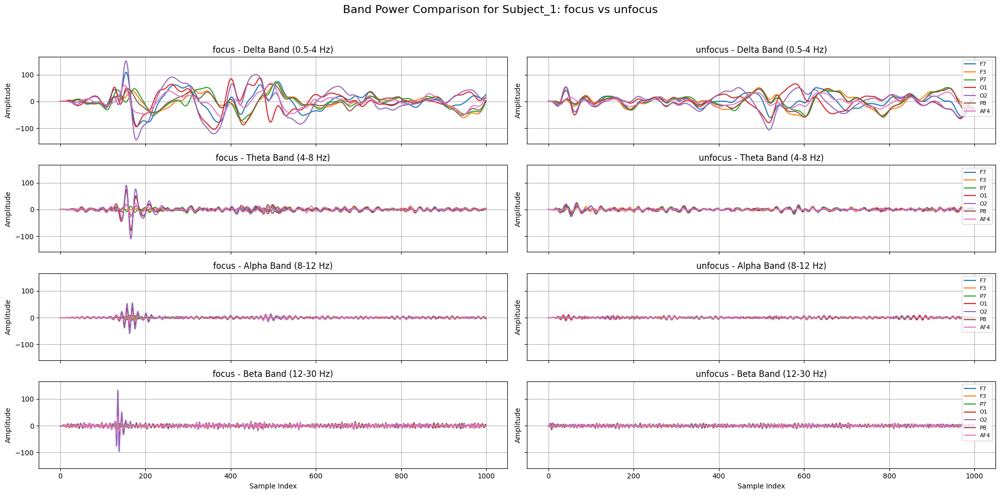

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import butter, lfilter

def bandpass_filter(data, sfreq, low, high, order=5):
    nyquist = 0.5 * sfreq
    low = low / nyquist
    high = high / nyquist
    b, a = butter(order, [low, high], btype='band')
    return lfilter(b, a, data, axis=1)  # Chỉnh sửa axis=1 để áp dụng bộ lọc theo chiều mẫu (columns)

def plot_comparison_band_power(data_split, sfreq, band_ranges, subject, states, sample_range):
    start, end = sample_range
    sample_steps = np.arange(start, end)  # Trục X là sample size
    fig, axs = plt.subplots(len(band_ranges), 2, figsize=(20, 10), sharex=True, sharey=True)
    fig.suptitle(f'Band Power Comparison for {subject}: {states[0]} vs {states[1]}', fontsize=16)

    for col, state in enumerate(states):
        data = data_split[state][subject]['Day_1'][:, start:end]  # Lấy dữ liệu theo trạng thái và sample range
        
        for row, (band, (low, high)) in enumerate(band_ranges.items()):
            # Lọc dữ liệu cho band hiện tại
            filtered_data = bandpass_filter(data, sfreq, low, high)
            
            # Vẽ dữ liệu cho mỗi channel
            for ch in range(filtered_data.shape[0]):  # Axis 0 là num_channels
                axs[row, col].plot(sample_steps, filtered_data[ch, :], label=channel_names[ch])
            
            axs[row, col].set_title(f'{state} - {band} Band ({low}-{high} Hz)', fontsize=12)
            axs[row, col].set_ylabel('Amplitude')
            axs[row, col].grid(True)
            if col == 1:
                axs[row, col].legend(fontsize=8)

    axs[-1, 0].set_xlabel('Sample Index')
    axs[-1, 1].set_xlabel('Sample Index')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# Sử dụng hàm
band_ranges = {'Delta': (0.5, 4), 'Theta': (4, 8), 'Alpha': (8, 12), 'Beta': (12, 30)}
sfreq = 128  # Tần số lấy mẫu
sample_range = (0, 1000)  # Khoảng sample cần hiển thị

subject = 'Subject_1'
states = ['focus', 'unfocus']  # Hai trạng thái cần so sánh

plot_comparison_band_power(data_split, sfreq, band_ranges, subject, states, sample_range)


## 2. Features Engineering

Sử dụng biến đổi Fourier bằng STFT

Trong quá trình xử lý tín hiệu EEG trong tập lệnh trên, Biến đổi Fourier được sử dụng để chuyển đổi tín hiệu từ miền thời gian sang miền tần số. Việc sử dụng biến đổi Fourier, cụ thể là Biến đổi Fourier ngắn hạn (STFT), mang lại nhiều lợi ích trong việc phân tích và trích xuất đặc trưng từ tín hiệu EEG.

1. Lý do sử dụng Biến đổi Fourier trong xử lý tín hiệu EEG:

Phân tích thành phần tần số: Tín hiệu EEG là một dạng tín hiệu phức tạp, chứa đựng thông tin ở nhiều dải tần số khác nhau. Mỗi dải tần số tương ứng với các hoạt động não bộ cụ thể:
Delta (0.5 - 4 Hz): Liên quan đến giấc ngủ sâu.
Theta (4 - 8 Hz): Liên quan đến buồn ngủ, mơ mộng.
Alpha (8 - 12 Hz): Liên quan đến thư giãn, tỉnh táo.
Beta (12 - 30 Hz): Liên quan đến tập trung, hoạt động nhận thức.
Trích xuất đặc trưng hữu ích: Việc chuyển tín hiệu sang miền tần số cho phép trích xuất công suất tại các dải tần số quan trọng, giúp phân biệt các trạng thái não bộ khác nhau.
Hiểu rõ hơn về hoạt động não bộ: Phân tích tần số giúp xác định các mẫu sóng đặc trưng, hỗ trợ trong việc chẩn đoán và nghiên cứu khoa học.

$n Segments = \frac{numSample}{segmentLenght}$

#### trích xuất bằng năng lượng phổ 

In [ ]:
import numpy as np
from scipy.signal import stft

def apply_stft_to_data_split(data_split, fs, window, nperseg, noverlap, nfft):
    power_result = {}

    for state, subjects_data in data_split.items():
        power_result[state] = {}
        for subject, days_data in subjects_data.items():
            n_channels, n_samples = next(iter(days_data.values())).shape  # Số kênh và số mẫu

            # Danh sách để lưu năng lượng phổ của từng kênh
            power_day_result = {}

            # Tính STFT cho từng kênh
            for day, data in days_data.items():
                power_day_list = []
                for ch in range(n_channels):
                    f, t, Zxx = stft(data[ch, :], fs=fs, window=window, nperseg=nperseg, 
                                     noverlap=noverlap, nfft=nfft, detrend=False, 
                                     return_onesided=True, boundary='zeros', padded=True)
                    power_day_list.append(np.abs(Zxx) ** 2)  # Năng lượng phổ

                # Lưu kết quả của mỗi ngày riêng biệt (không gộp lại thành mảng 4D)
                power_day_result[day] = np.stack(power_day_list, axis=0)  # (n_channels, nfft // 2 + 1, n_time_windows)

            # Lưu kết quả của từng subject cho từng trạng thái
            power_result[state][subject] = power_day_result

    return power_result


In [ ]:
# Cấu hình thông số STFT
fs = 128  # Tần số mẫu (Hz)
nperseg = 128  # Số mẫu trong mỗi cửa sổ (1 giây)
noverlap = 0  # Không chồng lấn
nfft = 1024  # Số điểm FFT
M = nperseg  # Độ dài cửa sổ Blackman
t_win = np.arange(0, M)
window_blackman = 0.42 - 0.5 * np.cos((2 * np.pi * t_win) / (M - 1)) + 0.08 * np.cos((4 * np.pi * t_win) / (M - 1))

# Áp dụng STFT cho dữ liệu
power_result = apply_stft_to_data_split(data_split, fs, window_blackman, nperseg, noverlap, nfft)


In [ ]:
(14, 4, 117)

(14, 4, 117)

In [ ]:
power_result['focus']['Subject_1']['Day_1'].shape

(7, 513, 601)

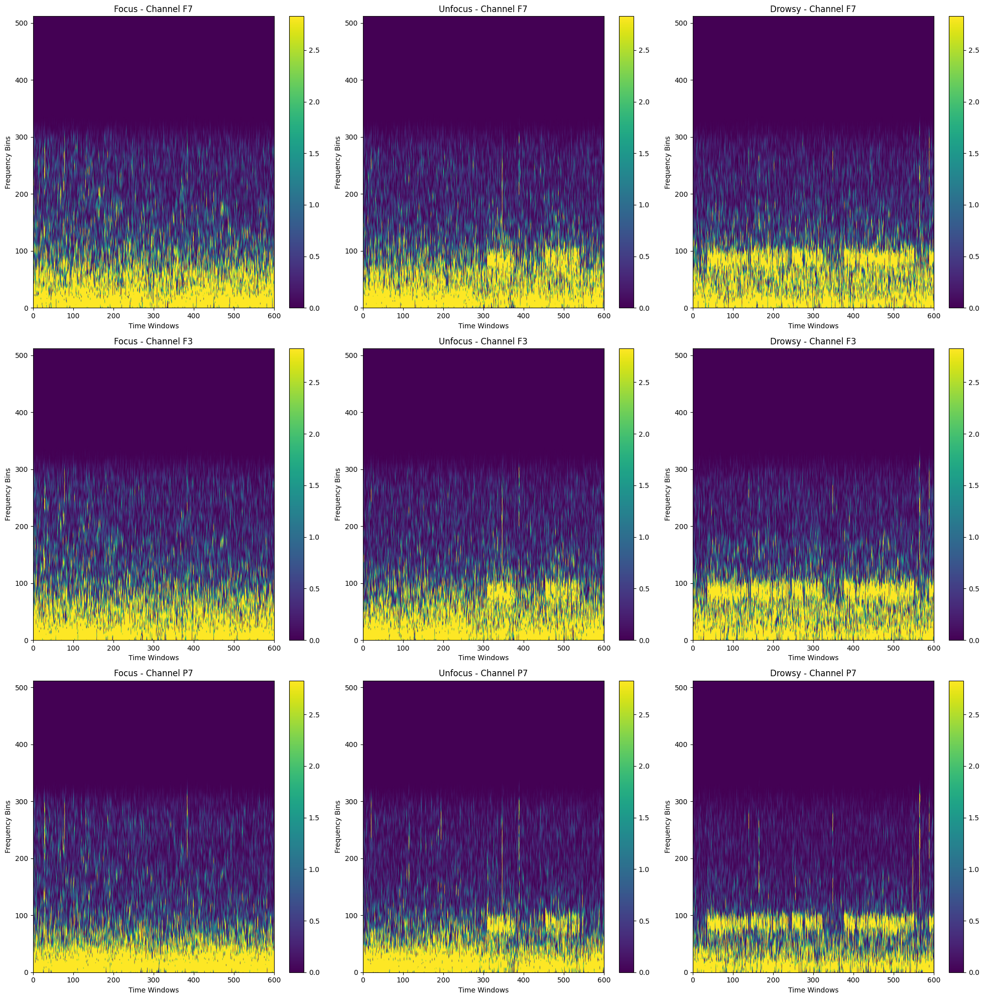

In [ ]:
def compare_power_result(power_result, subject, day):
    states = ['focus', 'unfocus', 'drowsy']

    fig, axes = plt.subplots(3, len(states), figsize=(20, 20))

    for i, state in enumerate(states):
        power_data = power_result[state][subject][day]
        for j in range(3):
            ax = axes[j, i]
            im = ax.pcolormesh(power_data[j, :, :], vmin=0, vmax=2*np.sqrt(2), shading='gouraud')
            ax.set_title(f'{state.capitalize()} - Channel {channel_names[j]}')
            ax.set_xlabel('Time Windows')
            ax.set_ylabel('Frequency Bins')
            fig.colorbar(im, ax=ax)

    plt.tight_layout()
    plt.show()

# Example usage
compare_power_result(power_result, 'Subject_1', 'Day_1')

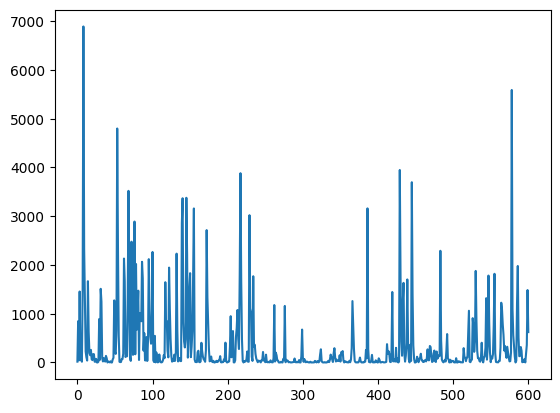

In [ ]:
plt.plot(power_result['focus']['Subject_1']['Day_1'][2,1,:])

In [ ]:
def combine_bins(power_result, n_bins=36, bin_size=4):
    power_result_binned = {}

    # Duyệt qua từng trạng thái (focus, unfocus, drowsy)
    for state, subjects_data in power_result.items():
        power_result_binned[state] = {}
        for subject, days_data in subjects_data.items():
            power_result_binned[state][subject] = {}
            for day, power in days_data.items():
                n_channels, n_freq_bins, n_time_windows = power.shape

                # Tạo mảng lưu dữ liệu đã gộp bins
                power_binned = np.zeros((n_channels, n_bins, n_time_windows))

                # Gộp các bins theo khoảng bin_size (0.5 Hz)
                for ch in range(n_channels):
                    for j in range(n_bins):
                        start_idx = j * bin_size
                        end_idx = start_idx + bin_size
                        power_binned[ch, j, :] = np.mean(power[ch, start_idx:end_idx, :], axis=0)

                # Lưu kết quả cho subject và day
                power_result_binned[state][subject][day] = power_binned

    return power_result_binned


In [ ]:
power_result_binned = combine_bins(power_result, n_bins=36, bin_size=4)
power_result_binned['focus']['Subject_1']['Day_1'].shape

(7, 36, 601)

In [ ]:
def average_running_window(power_result_binned, window_size=15):
    power_result_averaged = {}

    # Duyệt qua từng trạng thái (focus, unfocus, drowsy)
    for state, subjects_data in power_result_binned.items():
        power_result_averaged[state] = {}
        for subject, days_data in subjects_data.items():
            power_result_averaged[state][subject] = {}
            for day, power in days_data.items():
                n_channels, n_bins, n_time_windows = power.shape
                n_output_time_windows = n_time_windows - window_size + 1  # Số cửa sổ chạy

                # Tạo mảng lưu dữ liệu trung bình
                power_averaged = np.zeros((n_channels, n_bins, n_output_time_windows))

                # Tính trung bình qua cửa sổ chạy
                for t in range(n_output_time_windows):
                    power_averaged[:, :, t] = np.mean(power[:, :, t:t + window_size], axis=2)

                # Lưu kết quả cho subject và day
                power_result_averaged[state][subject][day] = power_averaged

    return power_result_averaged


In [ ]:
power_result_averaged = average_running_window(power_result_binned, window_size=15)
power_result_averaged['focus']['Subject_1']['Day_1'].shape  

(7, 36, 587)

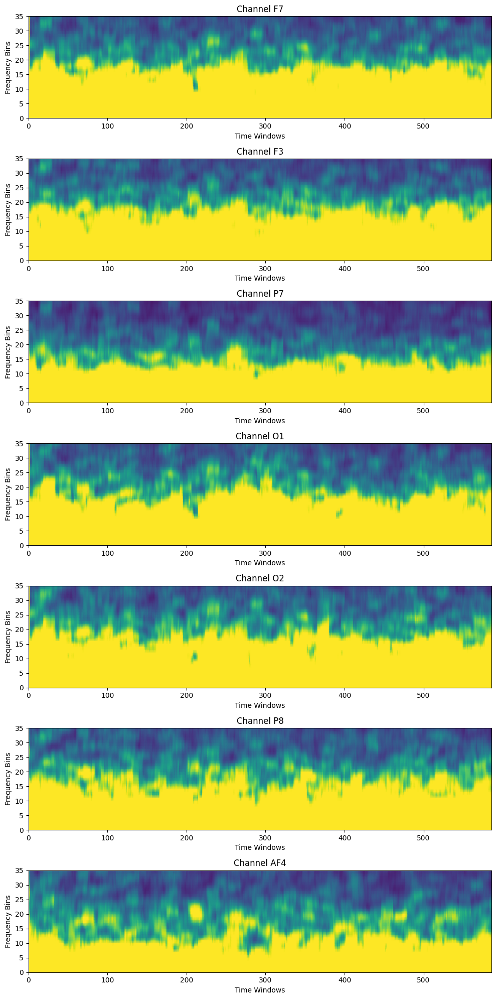

In [ ]:
fig, ax = plt.subplots(col, 1)
t1 = np.arange(0, power_result_averaged['focus']['Subject_1']['Day_1'].shape[2])
f1 = np.arange(0, power_result_averaged['focus']['Subject_1']['Day_1'].shape[1])
fig.set_size_inches(10, 20)
for i in range(col):
    ax[i].pcolormesh(t1, f1, power_result_averaged['focus']['Subject_1']['Day_1'][i, :, :], vmin=0, vmax=2*np.sqrt(2), shading='gouraud')
    ax[i].set_title(f'Channel {channel_names[i]}')
    ax[i].set_xlabel('Time Windows')
    ax[i].set_ylabel('Frequency Bins')
plt.tight_layout()
plt.show()

In [ ]:
power_result_averaged['focus']['Subject_1']['Day_1'].shape

(7, 36, 587)

In [ ]:
focus = {}
unfocus = {}
drowsy = {}

# Initialize the dictionaries with zeros
for subject in power_result_averaged['focus'].keys():
    n_channels, n_frequencies, n_time_windows = power_result_averaged['focus'][subject]['Day_1'].shape
    focus[subject] = {day: np.zeros([n_channels * n_frequencies, n_time_windows]) for day in power_result_averaged['focus'][subject].keys()}
    unfocus[subject] = {day: np.zeros([n_channels * n_frequencies, n_time_windows]) for day in power_result_averaged['focus'][subject].keys()}
    drowsy[subject] = {day: np.zeros([n_channels * n_frequencies, n_time_windows]) for day in power_result_averaged['focus'][subject].keys()}

# Reshape and log-transform the data
for subject in power_result_averaged['focus'].keys():
    for day in power_result_averaged['focus'][subject].keys():
        for j in range(n_time_windows):
            focus[subject][day][:, j] += power_result_averaged['focus'][subject][day][:, :, j].flatten()
            unfocus[subject][day][:, j] += power_result_averaged['unfocus'][subject][day][:, :, j].flatten()
            drowsy[subject][day][:, j] += power_result_averaged['drowsy'][subject][day][:, :, j].flatten()

        # Apply log-transform
        focus[subject][day] = 10 * np.log10(focus[subject][day])
        unfocus[subject][day] = 10 * np.log10(unfocus[subject][day])
        drowsy[subject][day] = 10 * np.log10(drowsy[subject][day])


In [ ]:
focus['Subject_1']['Day_1'].shape

(252, 587)

#### trích xuất bằng năng lượng dải tần số

In [ ]:
locs_2d = np.array([
    (5.0, 9.0),       # Trán phải (AF4)
    (-3.0, 5.0),      # Thái dương trái (F7)
    (-7.0, 3.0),      # Đỉnh trái (F3)
    (0.0, -9.0),      # Gáy (O1)
    (-3.0, 8.0),      # Thái dương trước trái (O2)
    (3.0, 8.0),       # Thái dương trước phải (P7)
    (-7.0, 1.0),      # Sau gáy trái (P8)
])

In [ ]:
import numpy as np
from scipy.signal import stft
import matplotlib.pyplot as plt

def eeg_to_spectrum_images(data_split, fs, window_size, stride):
    freq_bands = {
        "theta": (4, 8),   
        "alpha": (8, 13),  
        "beta": (13, 18)  
    }
   
    images = {}
   
    for state, subjects_data in data_split.items():
        images[state] = {}
       
        for subject, days_data in subjects_data.items():
            images[state][subject] = {}
           
            for day, eeg_data in days_data.items():
                n_channels, n_samples = eeg_data.shape
               
                # Calculate number of segments, ensuring it doesn't exceed data length
                n_segments = max(1, (n_samples - window_size) // stride + 1)
               
                # Preallocate list for day images
                day_images = []
               
                for seg_idx in range(n_segments):
                    # Calculate segment start and end
                    start = seg_idx * stride
                    end = min(start + window_size, n_samples)
                   
                    # Skip if segment is too small
                    if end - start < window_size:
                        break
                    # Extract segment (across all channels)
                    segment = eeg_data[:, start:end]
                   
                    # Compute STFT for each channel and average
                    channel_stfts = []
                    for channel in range(n_channels):
                        f, t, Zxx = stft(segment[channel], fs=fs, nperseg=window_size, noverlap=stride)
                        channel_stfts.append(np.abs(Zxx) ** 2)
                   
                    power_spectral = np.mean(channel_stfts, axis=0)
                   
                    band_powers = np.zeros((len(f) // 2, len(t), 3))  # 3 channels for RGB
                   
                    # Compute power for each frequency band
                    for i, (band_name, (low, high)) in enumerate(freq_bands.items()):
                        f_pos = f[:len(f) // 2]
                        
                        band_mask = (f_pos >= low) & (f_pos < high)
                       
                        if np.any(band_mask):
                            band_powers[:, :, i] = np.log1p(np.mean(power_spectral[:len(f) // 2, :][band_mask], axis=0))
                   
                    # Normalize band powers to [0, 1]
                    if np.max(band_powers) > 0:
                        band_powers = (band_powers - np.min(band_powers)) / (np.max(band_powers) - np.min(band_powers))
                   
                    day_images.append(band_powers)
               
                # Convert to numpy array if day_images is not empty
                if day_images:
                    images[state][subject][day] = np.array(day_images)
   
    return images

# Example usage function
def process_eeg_to_spectrum_images(data_split):
    # Parameters
    fs = 128  
    window_size = 512  
    stride = 128  
    
    try:
        # Convert EEG to spectrum images
        images = eeg_to_spectrum_images(data_split, fs, window_size, stride)
        
        # Print diagnostic information
        print("Conversion successful!")
        for state in images:
            for subject in images[state]:
                for day in images[state][subject]:
                    images[state][subject][day] = np.transpose(images[state][subject][day], (0, 2, 1, 3))
                    print(f"{state}/{subject}/{day} shape: {images[state][subject][day].shape}")
        
        return images
    except Exception as e:
        print(f"Error during conversion: {e}")
        raise

images = process_eeg_to_spectrum_images(data_split)


Conversion successful!
focus/Subject_1/Day_1 shape: (597, 3, 128, 3)
focus/Subject_1/Day_2 shape: (597, 3, 128, 3)
focus/Subject_1/Day_3 shape: (597, 3, 128, 3)
focus/Subject_1/Day_4 shape: (597, 3, 128, 3)
focus/Subject_1/Day_5 shape: (597, 3, 128, 3)
focus/Subject_2/Day_1 shape: (597, 3, 128, 3)
focus/Subject_2/Day_2 shape: (597, 3, 128, 3)
focus/Subject_2/Day_3 shape: (597, 3, 128, 3)
focus/Subject_2/Day_4 shape: (597, 3, 128, 3)
focus/Subject_2/Day_5 shape: (597, 3, 128, 3)
focus/Subject_3/Day_1 shape: (597, 3, 128, 3)
focus/Subject_3/Day_2 shape: (597, 3, 128, 3)
focus/Subject_3/Day_3 shape: (597, 3, 128, 3)
focus/Subject_3/Day_4 shape: (597, 3, 128, 3)
focus/Subject_3/Day_5 shape: (597, 3, 128, 3)
focus/Subject_4/Day_1 shape: (597, 3, 128, 3)
focus/Subject_4/Day_2 shape: (597, 3, 128, 3)
focus/Subject_4/Day_3 shape: (597, 3, 128, 3)
focus/Subject_4/Day_4 shape: (597, 3, 128, 3)
focus/Subject_5/Day_1 shape: (597, 3, 128, 3)
focus/Subject_5/Day_2 shape: (597, 3, 128, 3)
focus/Subje

In [ ]:
# !pip install scikit-image -q

In [ ]:
from skimage.transform import resize

def reshape_to_28x28(images):
    for state in images:
        for subject in images[state]:
            for day in images[state][subject]:
                # Get the current shape of images
                current_images = images[state][subject][day]

                # Initialize array to store reshaped images
                reshaped_images = np.zeros((current_images.shape[0], 28, 28, current_images.shape[-1]))

                # Resize each image
                for i in range(current_images.shape[0]):
                    for j in range(current_images.shape[-1]):  # Iterate over color channels
                        reshaped_images[i, :, :, j] = resize(current_images[i, :, :, j], (28, 28), mode='reflect')

                # Transpose the reshaped images to (597, 3, 28, 28)
                reshaped_images = reshaped_images.transpose(0, 3, 1, 2)

                # Replace original images with reshaped images
                images[state][subject][day] = reshaped_images

    return images

images_28 = reshape_to_28x28(images)

In [ ]:
def plot_sample_image(images,index):
    """
    Vẽ một ảnh cụ thể từ dữ liệu với tất cả các kênh màu (R, G, B).

    Args:
        images (numpy array): Dữ liệu ảnh với shape (597, 3, 28, 28).
        index (int): Chỉ số của ảnh cần vẽ.
    """
    # Lấy ảnh tại chỉ số index
    image = images[index]

    # Vẽ 3 kênh màu (R, G, B)
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    channels = ['Red', 'Green', 'Blue']
    colors = ['Reds', 'Greens', 'Blues']  # Colormap names in Matplotlib
    for i in range(3):
        axes[i].imshow(image[i], cmap=colors[i])  # Hiển thị mỗi kênh màu
        axes[i].set_title(f'Channel: {channels[i]}')
        axes[i].axis('off')

    plt.suptitle(f'Sample {index} - RGB Channels')
    plt.show()


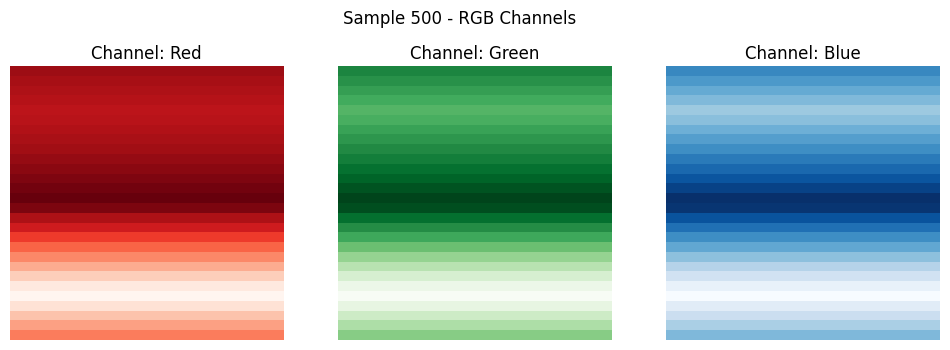

In [ ]:
plot_sample_image(images_28['focus']['Subject_1']['Day_1'], 500)

In [ ]:

def plot_rgb_image(images, index):
    """
    Gộp 3 kênh màu (R, G, B) thành một ảnh RGB duy nhất và hiển thị.

    Args:
        images (numpy array): Dữ liệu ảnh với shape (597, 3, 28, 28).
        index (int): Chỉ số của ảnh cần vẽ.
    """
    # Lấy ảnh tại chỉ số index
    image = images[index]

    # Gộp các kênh màu thành một ảnh RGB
    rgb_image = np.transpose(image, (1, 2, 0))  # Chuyển từ (3, 28, 28) -> (28, 28, 3)

    # Vẽ ảnh RGB
    plt.imshow(rgb_image)
    plt.axis('off')  # Tắt trục tọa độ
    plt.title(f'Sample {index} - RGB Image')
    plt.show()

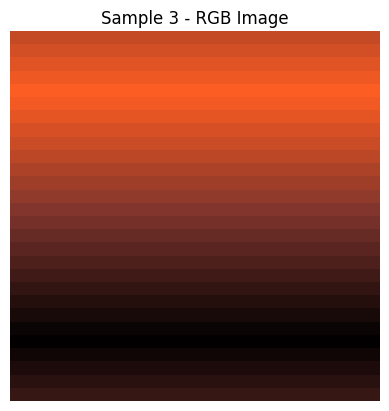

In [ ]:
plot_rgb_image(images_28['focus']['Subject_1']['Day_1'], 3)

## 3. Label and Split Data

In [ ]:
# Gán nhãn 0 cho trạng thái focus, 1 cho trạng thái unfocus, 2 cho trạng thái drowsy
label_focus = [0]*focus['Subject_1']['Day_1'].shape[1]
label_unfocus = [1]*focus['Subject_1']['Day_1'].shape[1]
label_drowsy = [2]*focus['Subject_1']['Day_1'].shape[1]


target=[]
subj=np.array([]).reshape(252,0).copy()
for name in focus.keys():
    subj=np.concatenate((subj,focus[name][day]), axis=1)
    subj=np.concatenate((subj,unfocus[name][day]), axis=1)
    subj=np.concatenate((subj,drowsy[name][day]), axis=1)  
    target = target+label_focus+label_unfocus+label_drowsy
subj=subj.T
target = np.array(target)

# kết hợp dữ liệu và nhãn
combined_data = []
combined_labels = []

for name in focus.keys():
    for day in focus[name].keys():
        combined_data.append(focus[name][day])
        combined_labels.extend(label_focus)
        combined_data.append(unfocus[name][day])
        combined_labels.extend(label_unfocus)
        combined_data.append(drowsy[name][day])
        combined_labels.extend(label_drowsy)

combined_data = np.concatenate(combined_data, axis=1).T
combined_labels = np.array(combined_labels)



In [ ]:
combined_data.shape

(40503, 252)

## 4. Model Development

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC

# Split the data into training and testing sets
data_train, data_test, labels_train, labels_test = train_test_split(combined_data, combined_labels, test_size=0.2, random_state=42)
scaler = StandardScaler()
data_train_scaled = scaler.fit_transform(data_train)
data_test_scaled = scaler.transform(data_test)


### 4.1 Thử nghiệm model SVM 

In [ ]:
# Tạo mô hình SVM
svm_model = SVC(kernel='rbf', C=1.0, random_state=42)

# Đo thời gian huấn luyện
start_train = time.time()
svm_model.fit(data_train_scaled, labels_train)
end_train = time.time()
train_time_svm = end_train - start_train  

# Đo thời gian dự đoán
start_predict = time.time()
y_pred = svm_model.predict(data_test_scaled)
end_predict = time.time()
predict_time_svm = end_predict - start_predict 

# Đánh giá hiệu năng
print("Model SVM: ")

# Ma trận nhầm lẫn
print("Confusion Matrix:")
print(confusion_matrix(labels_test, y_pred))

# Báo cáo phân loại
report_svm = classification_report(labels_test, y_pred)
print("\nClassification Report:")
print(report_svm)

# Độ chính xác trên tập huấn luyện và kiểm tra
train_svm_accuracy = svm_model.score(data_train_scaled, labels_train)
svm_acc = accuracy_score(labels_test, y_pred)
print(f"\nTrain Accuracy: {train_svm_accuracy:.4f}")
print(f"Test Accuracy: {svm_acc:.4f}")

# Thời gian huấn luyện và dự đoán
print(f"\nTraining Time: {train_time_svm:.2f} seconds")
print(f"Prediction Time: {predict_time_svm:.2f} seconds")

NameError: name 'SVC' is not defined

### 4.2 Thử nghiệm model Random Forest

In [ ]:
# Tạo mô hình Random Forest
rf_model = RandomForestClassifier(n_estimators=50, random_state=42)

# Đo thời gian huấn luyện
start_train = time.time()
rf_model.fit(data_train_scaled, labels_train)
end_train = time.time()

# Tính thời gian huấn luyện
train_time_rf = end_train - start_train

# Đo thời gian dự đoán
start_predict = time.time()
labels_pred = rf_model.predict(data_test_scaled)
end_predict = time.time()

# Tính thời gian dự đoán
predict_time_rf = end_predict - start_predict

print("Model Random Forest: ")

# Đánh giá hiệu năng
print("Confusion Matrix:")
print(confusion_matrix(labels_test, labels_pred))

report_rf = classification_report(labels_test, labels_pred)
print("\nClassification Report:")
print(report_rf)

# Tính độ chính xác
train_accuracy_rf = rf_model.score(data_train_scaled, labels_train)
accuracy_rf = accuracy_score(labels_test, labels_pred)
print(f"\nTrain Accuracy: {train_accuracy_rf:.4f}")
print(f"Test Accuracy: {accuracy_rf:.4f}")

# In thời gian huấn luyện và dự đoán
print(f"\nTraining Time: {train_time_rf:.2f} seconds")
print(f"Prediction Time: {predict_time_rf:.2f} seconds")


Model Random Forest: 
Confusion Matrix:
[[2713   13    2]
 [  33 2618   11]
 [   0   27 2684]]

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2728
           1       0.98      0.98      0.98      2662
           2       1.00      0.99      0.99      2711

    accuracy                           0.99      8101
   macro avg       0.99      0.99      0.99      8101
weighted avg       0.99      0.99      0.99      8101


Train Accuracy: 1.0000
Test Accuracy: 0.9894

Training Time: 31.09 seconds
Prediction Time: 0.11 seconds


#### Apply CNN models

##### Thử nghiệm trên mạng Convolutional 2D

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
import numpy as np
from sklearn.model_selection import train_test_split

In [ ]:
class ImageDataset(Dataset):
    def __init__(self, images, labels):
        self.images = torch.tensor(images, dtype=torch.float32)
        self.labels = torch.tensor(labels, dtype=torch.long)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        return self.images[idx], self.labels[idx]

# Hàm chuẩn bị dữ liệu từ dict
def prepare_data(images_dict):
    all_images = []
    all_labels = []

    for state in images_dict:
        for subject in images_dict[state]:
            for day in images_dict[state][subject]:
                images_data = images_dict[state][subject][day]
                all_images.append(images_data)

                # Gán nhãn theo 3 trạng thái: 'focus', 'unfocus', 'drowsy'
                label = state
                if label == 'focus':
                    label_idx = 0  # Nhãn 0 cho 'focus'
                elif label == 'unfocus':
                    label_idx = 1  # Nhãn 1 cho 'unfocus'
                elif label == 'drowsy':
                    label_idx = 2  # Nhãn 2 cho 'drowsy'
                else:
                    raise ValueError(f"Trạng thái không hợp lệ: {label}")

                # Thêm nhãn vào danh sách
                all_labels.extend([label_idx] * images_data.shape[0])

    all_images = np.concatenate(all_images, axis=0)  
    all_labels = np.array(all_labels) 

    # Chuẩn hóa ảnh (từ 0-255 sang 0-1)
    all_images = all_images / 255.0

    return all_images, all_labels

In [ ]:
images['focus']['Subject_4']['Day_4'].shape

(597, 3, 28, 28)

In [ ]:
X, y = prepare_data(images_28)

# Chuyển dữ liệu thành tensor PyTorch
X_tensor = torch.tensor(X, dtype=torch.float32)
y_tensor = torch.tensor(y, dtype=torch.long)

# Chia dữ liệu thành tập huấn luyện và kiểm tra
X_train, X_test, y_train, y_test = train_test_split(X_tensor, y_tensor, test_size=0.2, random_state=42)

train_dataset = ImageDataset(X_train, y_train)
test_dataset = ImageDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

In [ ]:
# 2. Xây dựng mô hình CNN
class CNNModel(nn.Module):
    def __init__(self, num_classes=3):
        super(CNNModel, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        self.relu = nn.ReLU()

        # Số lượng đầu vào của fc1 phụ thuộc vào kích thước sau pooling
        self.fc1_input_dim = 64 * 3 * 3  # Thay đổi kích thước này nếu ảnh có kích thước khác
        self.fc1 = nn.Linear(self.fc1_input_dim, 128)
        self.fc2 = nn.Linear(128, num_classes)  # 3 lớp (focus, distract, sleepy)

    def forward(self, x):
        x = self.pool(self.relu(self.conv1(x)))
        x = self.pool(self.relu(self.conv2(x)))
        x = self.pool(self.relu(self.conv3(x)))
        x = x.view(-1, self.fc1_input_dim)  # Làm phẳng tensor
        x = self.relu(self.fc1(x))
        x = self.fc2(x)
        return x


In [ ]:
# 3. Khởi tạo mô hình, loss function và optimizer
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = CNNModel(num_classes=3).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [ ]:
np.random.seed(42)
def train_model(model, train_loader, criterion, optimizer, epochs=10):
    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()

            # Forward pass
            outputs = model(images)

            # Tính loss
            loss = criterion(outputs, labels)

            # Backward pass và cập nhật trọng số
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

            # Tính số lượng dự đoán đúng
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        print(f"Epoch {epoch+1}/{epochs}, Loss: {running_loss/len(train_loader):.4f}, Accuracy: {100 * correct/total:.2f}%")

def evaluate_model(model, test_loader):
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    
    accuracy = correct / total
    return accuracy

In [ ]:
train_loader.dataset.images.shape

torch.Size([32954, 3, 28, 28])

In [ ]:
train_model(model, train_loader, criterion, optimizer, epochs=20)

Epoch 1/20, Loss: 1.0989, Accuracy: 33.22%
Epoch 2/20, Loss: 1.0987, Accuracy: 33.30%
Epoch 3/20, Loss: 1.0988, Accuracy: 33.31%
Epoch 4/20, Loss: 1.0987, Accuracy: 33.32%
Epoch 5/20, Loss: 1.0987, Accuracy: 33.18%
Epoch 6/20, Loss: 1.0987, Accuracy: 32.75%
Epoch 7/20, Loss: 1.0987, Accuracy: 33.31%
Epoch 8/20, Loss: 1.0987, Accuracy: 33.32%
Epoch 9/20, Loss: 1.0987, Accuracy: 33.29%
Epoch 10/20, Loss: 1.0987, Accuracy: 33.12%
Epoch 11/20, Loss: 1.0987, Accuracy: 33.54%
Epoch 12/20, Loss: 1.0987, Accuracy: 33.38%
Epoch 13/20, Loss: 1.0987, Accuracy: 33.48%
Epoch 14/20, Loss: 1.0987, Accuracy: 33.13%
Epoch 15/20, Loss: 1.0987, Accuracy: 33.43%
Epoch 16/20, Loss: 1.0987, Accuracy: 33.45%
Epoch 17/20, Loss: 1.0987, Accuracy: 33.14%
Epoch 18/20, Loss: 1.0987, Accuracy: 33.08%
Epoch 19/20, Loss: 1.0987, Accuracy: 33.40%
Epoch 20/20, Loss: 1.0987, Accuracy: 33.00%


In [ ]:
# Sử dụng hàm để đánh giá mô hình
accuracy = evaluate_model(model, test_loader)
print(f"Test Accuracy: {accuracy:.4f}")

Test Accuracy: 0.3292


##### Thử nghiệm trên mạng Convolutional 1D

In [ ]:
data_split['focus']['Subject_1']['Day_2'].shape

(7, 76800)

In [ ]:
import numpy as np

def prepare_data_eeg(data_split):
    all_data = []
    all_labels = []
    
    for state, subjects in data_split.items():
        for subject, days in subjects.items():  
            for day, data in days.items():
                all_data.append(data)
                # Tạo nhãn tương ứng với số cột của dữ liệu hiện tại
                if state == 'focus':
                    label = 0
                elif state == 'unfocus':
                    label = 1
                else:
                    label = 2
                all_labels.extend([label] * data.shape[1])  # Nhân nhãn lên theo số cột
    
    # Gộp dữ liệu theo chiều [1]
    all_data = np.hstack(all_data)  # Gộp cột (theo chiều [1])
    all_labels = np.array(all_labels)

    return all_data, all_labels


In [ ]:
all_data, all_labels = prepare_data_eeg(data_split)

In [ ]:
all_data.shape, all_labels.shape

((7, 5299200), (5299200,))

In [ ]:
# Reshape lại dữ liệu để mỗi mẫu có 7 kênh (5299200, 7)
X = all_data.T  # Chuyển thành shape (5299200, 7)
y = all_labels  # Các nhãn vẫn giữ shape (5299200,)


In [ ]:
X.shape, y.shape

((5299200, 7), (5299200,))

In [ ]:
np.random.seed(42)

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.preprocessing import StandardScaler
from torch.utils.data import TensorDataset, DataLoader
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedShuffleSplit

sequence_length = 128  
random_state = 42

# Chuẩn hóa dữ liệu EEG
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)  

# Chuyển thành tensor PyTorch
X_tensor = torch.tensor(X_scaled, dtype=torch.float32)
y_tensor = torch.tensor(y, dtype=torch.long)

# Tính toán lại số mẫu sau khi reshape
num_samples = X.shape[0] // sequence_length 

# Reshape lại X_tensor thành (num_samples, 7, sequence_length)
X_tensor = X_tensor[:num_samples * sequence_length].reshape(num_samples, 7, sequence_length)
y_tensor = y_tensor[:num_samples]

# Chia thành train và temp (val + test)
splitter = StratifiedShuffleSplit(n_splits=1, test_size=0.3, random_state=random_state)
for train_index, temp_index in splitter.split(X_tensor, y_tensor):
    X_train, X_temp = X_tensor[train_index], X_tensor[temp_index]
    y_train, y_temp = y_tensor[train_index], y_tensor[temp_index]

# Chia temp thành val và test (2:1)
splitter = StratifiedShuffleSplit(n_splits=1, test_size=0.33, random_state=random_state)
for val_index, test_index in splitter.split(X_temp, y_temp):
    X_val, X_test = X_temp[val_index], X_temp[test_index]
    y_val, y_test = y_temp[val_index], y_temp[test_index]

# Tạo DataLoader
train_dataset = TensorDataset(X_train, y_train)
test_dataset = TensorDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Định nghĩa mô hình CNN 1D
class EEG_CNN_1D(nn.Module):
    def __init__(self, input_channels=7, num_classes=3):
        super(EEG_CNN_1D, self).__init__()
        
        # Các lớp Conv1d
        self.conv1 = nn.Conv1d(input_channels, 32, kernel_size=5, stride=1, padding=2)
        self.conv2 = nn.Conv1d(32, 64, kernel_size=5, stride=1, padding=2)
        self.conv3 = nn.Conv1d(64, 128, kernel_size=5, stride=1, padding=2)  # Lớp 3

        
        # MaxPooling
        self.pool = nn.MaxPool1d(kernel_size=2, stride=2)
        
        # Tính toán kích thước sau 2 lần max pooling
        def conv_output_size(input_size, kernel_size, stride, padding):
            return (input_size + 2*padding - (kernel_size - 1) - 1) // stride + 1
        
        input_size = X_train.shape[2]
        conv1_output_size = conv_output_size(input_size, kernel_size=5, stride=1, padding=2)
        pool1_output_size = conv1_output_size // 2
        conv2_output_size = conv_output_size(pool1_output_size, kernel_size=5, stride=1, padding=2)
        pool2_output_size = conv2_output_size // 2
        conv3_output_size = conv_output_size(pool2_output_size, kernel_size=5, stride=1, padding=2)
        pool3_output_size = conv3_output_size // 2
        flattened_size = 64 * pool2_output_size
        
        # Các lớp Fully connected
        self.fc1 = nn.Linear(flattened_size, 128)
        self.fc2 = nn.Linear(128, num_classes)
    
    def forward(self, x):
        x = self.pool(torch.relu(self.conv1(x)))  # Conv1 + ReLU + Pooling
        x = self.pool(torch.relu(self.conv2(x)))  # Conv2 + ReLU + Pooling
        x = self.pool(torch.relu(self.conv3(x)))  # Conv3 + ReLU + Pooling
        x = x.view(x.size(0), -1)  # Flatten
        x = torch.relu(self.fc1(x))  # Fully connected layer 1
        x = self.fc2(x)  # Fully connected layer 2 (output layer)
        return x

# Khởi tạo model, loss function và optimizer
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = EEG_CNN_1D().to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Huấn luyện mô hình
epochs = 20
for epoch in range(epochs):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
    
    print(f'Epoch [{epoch+1}/{epochs}], Loss: {running_loss/len(train_loader):.4f}, Accuracy: {100 * correct / total:.2f}%')

# Đánh giá mô hình trên tập test
model.eval()
correct = 0
total = 0
with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print(f'Test Accuracy: {100 * correct / total:.2f}%')

Epoch [1/20], Loss: 0.0032, Accuracy: 99.89%
Epoch [2/20], Loss: 0.0000, Accuracy: 100.00%
Epoch [3/20], Loss: 0.0000, Accuracy: 100.00%
Epoch [4/20], Loss: 0.0000, Accuracy: 100.00%
Epoch [5/20], Loss: 0.0000, Accuracy: 100.00%
Epoch [6/20], Loss: 0.0000, Accuracy: 100.00%
Epoch [7/20], Loss: 0.0000, Accuracy: 100.00%
Epoch [8/20], Loss: 0.0000, Accuracy: 100.00%
Epoch [9/20], Loss: 0.0000, Accuracy: 100.00%
Epoch [10/20], Loss: 0.0000, Accuracy: 100.00%
Epoch [11/20], Loss: 0.0000, Accuracy: 100.00%
Epoch [12/20], Loss: 0.0000, Accuracy: 100.00%
Epoch [13/20], Loss: 0.0000, Accuracy: 100.00%
Epoch [14/20], Loss: 0.0000, Accuracy: 100.00%
Epoch [15/20], Loss: 0.0000, Accuracy: 100.00%
Epoch [16/20], Loss: 0.0000, Accuracy: 100.00%
Epoch [17/20], Loss: 0.0000, Accuracy: 100.00%
Epoch [18/20], Loss: 0.0000, Accuracy: 100.00%
Epoch [19/20], Loss: 0.0000, Accuracy: 100.00%
Epoch [20/20], Loss: 0.0000, Accuracy: 100.00%
Test Accuracy: 100.00%


In [ ]:
print(X_tensor.shape)

torch.Size([41400, 7, 128])


In [ ]:
data = X
labels = y

In [ ]:
data.shape

(5299200, 7)

In [ ]:
# import torch
# import torch.nn as nn
# import torch.optim as optim
# from torch.utils.data import Dataset, DataLoader
# from sklearn.model_selection import train_test_split

# # Chuyển đổi dữ liệu thành Tensor
# data_tensor = torch.tensor(data, dtype=torch.float32)  # data có shape (N_samples, n_channels)
# labels_tensor = torch.tensor(labels, dtype=torch.long)  # labels có shape (N_samples, )

# # Tiền xử lý dữ liệu: Chia thành tập huấn luyện và kiểm tra (80% train, 20% test)
# X_train, X_test, y_train, y_test = train_test_split(data_tensor, labels_tensor, test_size=0.2, random_state=42)

# # Tạo Dataset tùy chỉnh cho PyTorch
# class EEGDataset(Dataset):
#     def __init__(self, data, labels):
#         self.data = data
#         self.labels = labels
        
#     def __len__(self):
#         return len(self.data)
    
#     def __getitem__(self, idx):
#         return self.data[idx], self.labels[idx]

# # Tạo DataLoader cho tập huấn luyện và kiểm tra
# train_dataset = EEGDataset(X_train, y_train)
# test_dataset = EEGDataset(X_test, y_test)

# train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
# test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

# class EEG_FullyConnectedNN(nn.Module):
#     def __init__(self, input_dim, num_classes=3):
#         super(EEG_FullyConnectedNN, self).__init__()
        
#         # Các lớp ẩn
#         self.fc1 = nn.Linear(input_dim, 128)  # Lớp đầu vào
#         self.fc2 = nn.Linear(128, 64)  # Lớp ẩn thứ hai
#         self.fc3 = nn.Linear(64, 32)   # Lớp ẩn thứ ba
#         self.fc4 = nn.Linear(32, num_classes)  # Lớp đầu ra, số lượng lớp = số trạng thái (classes)
#         self.relu = nn.ReLU()
#         self.softmax = nn.Softmax(dim=1)  # Hàm kích hoạt Softmax cho phân loại đa lớp
    
#     def forward(self, x):
#         x = self.relu(self.fc1(x))  # Áp dụng ReLU sau lớp fc1
#         x = self.relu(self.fc2(x))  # Áp dụng ReLU sau lớp fc2
#         x = self.relu(self.fc3(x))  # Áp dụng ReLU sau lớp fc3
#         x = self.fc4(x)  # Lớp đầu ra
#         return x

# # Khởi tạo mô hình
# input_dim = data.shape[1]  # Số lượng kênh EEG (n_channels)
# model = EEG_FullyConnectedNN(input_dim=input_dim, num_classes=3).to(device)
# criterion = nn.CrossEntropyLoss()  # CrossEntropyLoss cho bài toán phân loại đa lớp
# optimizer = optim.Adam(model.parameters(), lr=0.001)  # Adam optimizer
# # Huấn luyện mô hình
# num_epochs = 20

# for epoch in range(num_epochs):
#     model.train()  # Chuyển mô hình sang chế độ huấn luyện
#     running_loss = 0.0
#     correct = 0
#     total = 0
    
#     for inputs, labels in train_loader:
#         inputs, labels = inputs.to(device), labels.to(device)  
#         # Forward pass
#         outputs = model(inputs)  # Dự đoán từ mô hình
#         loss = criterion(outputs, labels)  # Tính loss
        
#         # Backward pass và cập nhật trọng số
#         optimizer.zero_grad()  # Đặt gradient về 0
#         loss.backward()  # Tính gradient
#         optimizer.step()  # Cập nhật trọng số
        
#         running_loss += loss.item()
        
#         # Tính số lượng dự đoán chính xác
#         _, predicted = torch.max(outputs.data, 1)
#         total += labels.size(0)
#         correct += (predicted == labels).sum().item()
    
#     epoch_loss = running_loss / len(train_loader)
#     epoch_accuracy = correct / total * 100
#     print(f"Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss:.4f}, Accuracy: {epoch_accuracy:.2f}%")


### 4.3 Compare Model Performance 

In [ ]:
import numpy as np
import matplotlib.pyplot as plt


def plot_auc_roc_comparison(model1, model2, data_test, labels_test, n_classes, model_names=("Model 1", "Model 2")):
    """
    Hàm vẽ biểu đồ AUC-ROC so sánh hai mô hình.
    
    Parameters:
    - model1, model2: Các mô hình đã huấn luyện, có phương thức `predict_proba`.
    - data_test: Dữ liệu kiểm tra (scaled).
    - labels_test: Nhãn kiểm tra (dạng integer).
    - n_classes: Số lớp trong bài toán phân loại.
    - model_names: Tuple chứa tên của hai mô hình để hiển thị trên biểu đồ.
    """
    # Chuyển nhãn kiểm tra sang dạng nhị phân
    labels_test_binarized = label_binarize(labels_test, classes=np.arange(n_classes))

    def calculate_roc_auc(model, data_test, labels_test_binarized):
        # Dự đoán xác suất
        y_score = model.predict_proba(data_test)

        # Tính ROC và AUC cho từng lớp
        fpr = dict()
        tpr = dict()
        roc_auc = dict()
        for i in range(n_classes):
            fpr[i], tpr[i], _ = roc_curve(labels_test_binarized[:, i], y_score[:, i])
            roc_auc[i] = auc(fpr[i], tpr[i])

        # Tính macro-average ROC và AUC
        all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
        mean_tpr = np.zeros_like(all_fpr)
        for i in range(n_classes):
            mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
        mean_tpr /= n_classes
        fpr["macro"] = all_fpr
        tpr["macro"] = mean_tpr
        roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
        
        return fpr, tpr, roc_auc

    # Tính ROC và AUC cho cả hai mô hình
    fpr1, tpr1, roc_auc1 = calculate_roc_auc(model1, data_test, labels_test_binarized)
    fpr2, tpr2, roc_auc2 = calculate_roc_auc(model2, data_test, labels_test_binarized)

    # Vẽ Subplot
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    # Vẽ ROC cho Model 1
    colors = ['blue', 'green', 'red']
    for i, color in enumerate(colors):
        axes[0].plot(fpr1[i], tpr1[i], color=color, lw=2,
                     label=f"Class {i} (AUC = {roc_auc1[i]:.2f})")
    axes[0].plot(fpr1["macro"], tpr1["macro"], color='navy', linestyle='--', lw=2,
                 label=f"Macro-Average (AUC = {roc_auc1['macro']:.2f})")
    axes[0].plot([0, 1], [0, 1], color='gray', linestyle='--', lw=1)
    axes[0].set_title(f"{model_names[0]} ROC Curve", fontsize=14)
    axes[0].set_xlabel("False Positive Rate (FPR)", fontsize=12)
    axes[0].set_ylabel("True Positive Rate (TPR)", fontsize=12)
    axes[0].legend(loc="lower right", fontsize=10)
    axes[0].grid(alpha=0.3)

    # Vẽ ROC cho Model 2
    for i, color in enumerate(colors):
        axes[1].plot(fpr2[i], tpr2[i], color=color, lw=2,
                     label=f"Class {i} (AUC = {roc_auc2[i]:.2f})")
    axes[1].plot(fpr2["macro"], tpr2["macro"], color='navy', linestyle='--', lw=2,
                 label=f"Macro-Average (AUC = {roc_auc2['macro']:.2f})")
    axes[1].plot([0, 1], [0, 1], color='gray', linestyle='--', lw=1)
    axes[1].set_title(f"{model_names[1]} ROC Curve", fontsize=14)
    axes[1].set_xlabel("False Positive Rate (FPR)", fontsize=12)
    axes[1].legend(loc="lower right", fontsize=10)
    axes[1].grid(alpha=0.3)

    plt.tight_layout()
    plt.show()


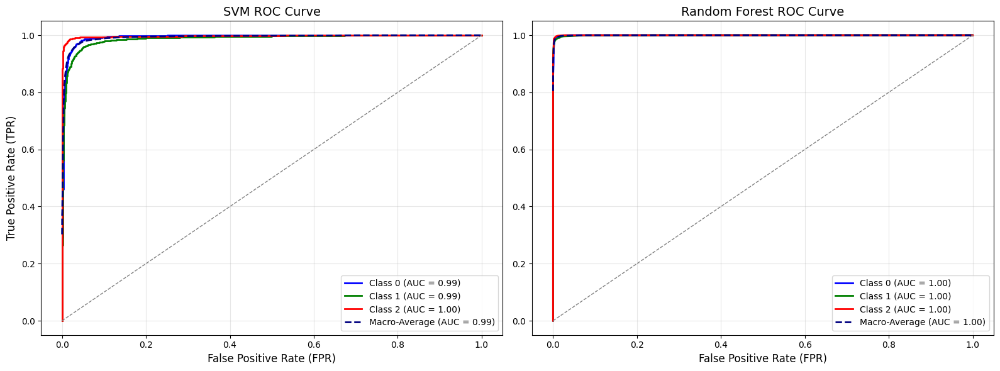

In [ ]:
# Số lớp
n_classes = len(np.unique(labels_test))

# So sánh SVM và Random Forest
plot_auc_roc_comparison(svm_model, rf_model, data_test_scaled, labels_test, 
                        n_classes=n_classes, model_names=("SVM", "Random Forest"))

In [ ]:
# Tạo một dictionary để lưu các thông số hiệu năng
performance_data = {
    'Model': ['SVM', 'Random Forest'],
    'Train Accuracy': [train_svm_accuracy, train_accuracy_rf],
    'Test Accuracy': [svm_acc, accuracy_rf],
    'Training Time (seconds)': [train_time_svm, train_time_rf],
    'Prediction Time (seconds)': [predict_time_svm, predict_time_rf]
}


svm_report = classification_report(labels_test, y_pred, output_dict=True)
svm_df = pd.DataFrame(svm_report).transpose()


rf_report = classification_report(labels_test, labels_pred, output_dict=True)
rf_df = pd.DataFrame(rf_report).transpose()

# Chuyển dictionary thành DataFrame
performance_df = pd.DataFrame(performance_data)
comparison_df = pd.concat([svm_df, rf_df], axis=0)

In [ ]:
print("Comparison Performance Model SVM vs Random Forest:")
performance_df

Comparison Performance Model SVm:


,Model,Train Accuracy,Test Accuracy,Training Time (seconds),Prediction Time (seconds)
0,SVM,0.963953,0.953339,83.362839,25.881839
1,Random Forest,1.000000,0.989384,30.782289,0.082109


In [ ]:
print("Comparison Precision, Recall, F1 score SVM vs Random Forest:")
comparison_df

Comparison Precision, Recall, F1 score SVM vs Random Forest:


,precision,recall,f1-score,support
0,0.939893,0.962977,0.951295,2728.000000
1,0.936526,0.925620,0.931041,2662.000000
2,0.983925,0.970859,0.977349,2711.000000
accuracy,0.953339,0.953339,0.953339,0.953339
macro avg,0.953448,0.953152,0.953228,8101.000000
weighted avg,0.953522,0.953339,0.953358,8101.000000
0,0.987983,0.994501,0.991231,2728.000000
1,0.984951,0.983471,0.984211,2662.000000
2,0.995180,0.990041,0.992604,2711.000000
accuracy,0.989384,0.989384,0.989384,0.989384


Từ kết quả trên ta dễ dang nhận thấy model Random Forest cho ra hiệu năng cao hơn cả về thời gian huấn luyện cũng như độ chính xác. Chính vị vậy ta sẽ chọn model này đi tinh chỉnh tham số và đánh giá dựa vào KFold để có cái nhìn tổng quan về mô hình

### 4.4 Hyperparameter Tuning Model

In [ ]:
from sklearn.model_selection import GridSearchCV
import pandas as pd

# Định nghĩa mô hình Random Forest
rf_model = RandomForestClassifier(random_state=42)

# Định nghĩa lưới tham số
param_grid = {
    'n_estimators': [10, 20, 50],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2']
}

# Cấu hình Grid Search
grid_search = GridSearchCV(
    estimator=rf_model,
    param_grid=param_grid,
    scoring='accuracy',
    cv=5,  # Số lượng Fold
    verbose=2,
    n_jobs=-1,
    return_train_score=True 
)

# Thực hiện Grid Search
grid_search.fit(data_train_scaled, labels_train)

# Lấy kết quả từ GridSearchCV
cv_results = pd.DataFrame(grid_search.cv_results_)

print("Best Parameters:", grid_search.best_params_)
print("Best Accuracy:", grid_search.best_score_)

# Tính điểm trung bình và độ lệch chuẩn giữa các Fold
cv_results_summary = cv_results[['param_n_estimators', 'param_min_samples_leaf', 
                                  'param_max_features', 'mean_test_score', 
                                  'std_test_score']]

cv_results_summary = cv_results_summary.rename(columns={
    'mean_test_score': 'Mean Accuracy',
    'std_test_score': 'Std Dev Accuracy'
})

print("\nSummary of Scores Across Folds:")
print(cv_results_summary)



Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best Parameters: {'max_features': 'log2', 'min_samples_leaf': 1, 'n_estimators': 50}
Best Accuracy: 0.9849083074742694

Summary of Scores Across Folds:
    param_n_estimators  param_min_samples_leaf param_max_features  \
0                   10                       1               sqrt   
1                   20                       1               sqrt   
2                   50                       1               sqrt   
3                   10                       2               sqrt   
4                   20                       2               sqrt   
5                   50                       2               sqrt   
6                   10                       4               sqrt   
7                   20                       4               sqrt   
8                   50                       4               sqrt   
9                   10                       1               log2   
10                  20      

## 5. Analyss and Visualization

### 5.1 Visualize EEG signals

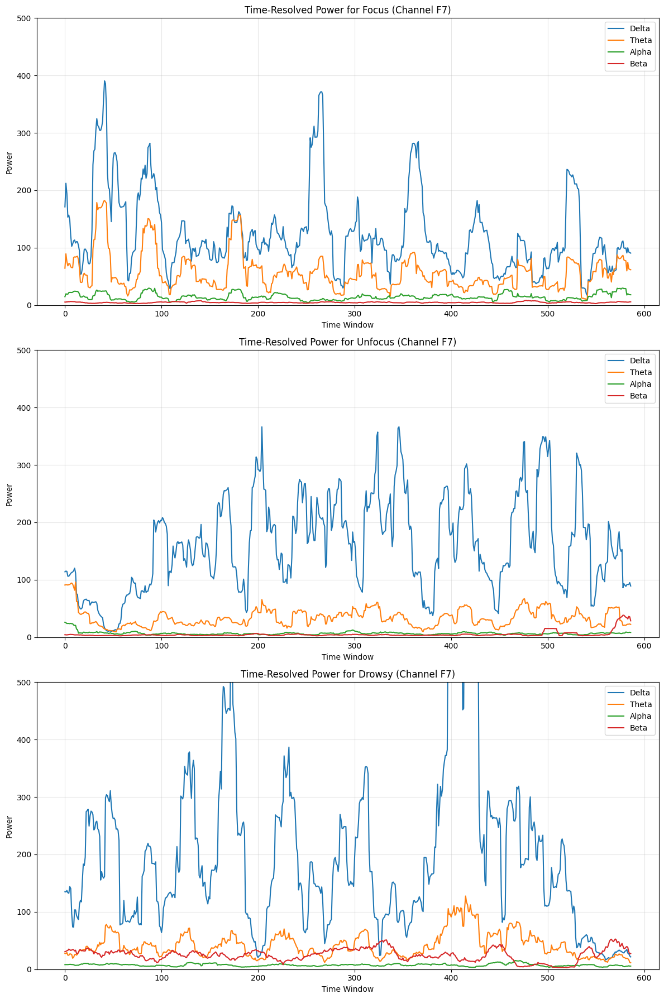

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def compare_time_resolved_power_separated(power_averaged, states=['focus', 'unfocus', 'drowsy'], bins=[0, 3, 7, 12, 30], labels=['Delta', 'Theta', 'Alpha', 'Beta'], channel_name='F7', channel_names=None):
    # Kiểm tra nếu channel_names không được cung cấp, sử dụng mặc định
    if channel_names is None:
        channel_names = ['F7', 'F3', 'P7', 'O1', 'O2', 'P8', 'AF4']

    # Tìm chỉ số của kênh dựa trên tên kênh
    channel = channel_names.index(channel_name)

    # Lấy thời gian từ power_averaged
    time = np.arange(power_averaged['focus'][list(power_averaged['focus'].keys())[0]]['Day_1'].shape[2])

    # Tạo figure và axes cho từng trạng thái
    fig, axes = plt.subplots(len(states), 1, figsize=(12, 6 * len(states)))
    
    if len(states) == 1:
        axes = [axes]  # Chuyển axes thành list nếu chỉ có 1 trạng thái

    # Duyệt qua các trạng thái và vẽ biểu đồ cho mỗi trạng thái
    for idx, state in enumerate(states):
        ax = axes[idx]
        for start, end, label in zip(bins[:-1], bins[1:], labels):
            avg_power = np.mean(power_averaged[state][list(power_averaged[state].keys())[0]]['Day_2'][channel, start:end, :], axis=0)
            ax.plot(time, avg_power, label=f'{label}')
        
        # Thiết lập tiêu đề, nhãn và lưới cho từng subplot
        ax.set_title(f'Time-Resolved Power for {state.capitalize()} (Channel {channel_names[channel]})')
        ax.set_xlabel('Time Window')
        ax.set_ylabel('Power')
        ax.set_ylim(0, 500)  # Điều chỉnh mức giới hạn của trục y
        ax.legend()
        ax.grid(alpha=0.3)

    # Hiển thị biểu đồ
    plt.tight_layout()
    plt.show()


compare_time_resolved_power_separated(power_result_averaged, states=['focus', 'unfocus', 'drowsy'], channel_name='F7', channel_names=channel_names)


Nhận xét: từ mức năng lượng của các dải sóng ảnh hưởng đến việc dự đoán trạng thái của người tham gia. Trạng thái tập trung và không tập trung dường như có liên quan đến hoạt động sóng não EEG dải tần từ 1-10Hz như dải **Delta** và dải **Theta**. Và trạng thái buồn ngủ có thể được phân biệt bằng sự hoạt động các dải năng lượng **Alpha** có dải tần trong khoảng 10-15Hz

### 5.2 Confusion Metrics Evaluation

In [ ]:
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(model, X_test, y_test, target_names, figsize=(8, 6)):

    # Dự đoán từ mô hình
    y_pred = model.predict(X_test)
    
    # Tính toán confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    
    # Vẽ confusion matrix bằng seaborn heatmap
    plt.figure(figsize=figsize)
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", 
                xticklabels=target_names, yticklabels=target_names)
    
    # Thiết lập tiêu đề và nhãn
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()


In [ ]:
from sklearn.ensemble import RandomForestClassifier

# Lấy các tham số tốt nhất từ GridSearchCV
best_params = grid_search.best_params_

# Cấu hình lại mô hình với các tham số tốt nhất
best_rf_model = RandomForestClassifier(
    n_estimators=best_params['n_estimators'],
    min_samples_leaf=best_params['min_samples_leaf'],
    max_features=best_params['max_features'],
    random_state=42
)

# Huấn luyện lại mô hình với dữ liệu huấn luyện
best_rf_model.fit(data_train_scaled, labels_train)

# Kiểm tra độ chính xác trên tập huấn luyện
train_accuracy = best_rf_model.score(data_train_scaled, labels_train)
print(f"Training Accuracy with Best Parameters: {train_accuracy}")
test_accuracy = best_rf_model.score(data_test_scaled, labels_test)
print(f"Test Accuracy with Best Parameters: {test_accuracy}")


Training Accuracy with Best Parameters: 1.0
Test Accuracy with Best Parameters: 0.9895074682138008


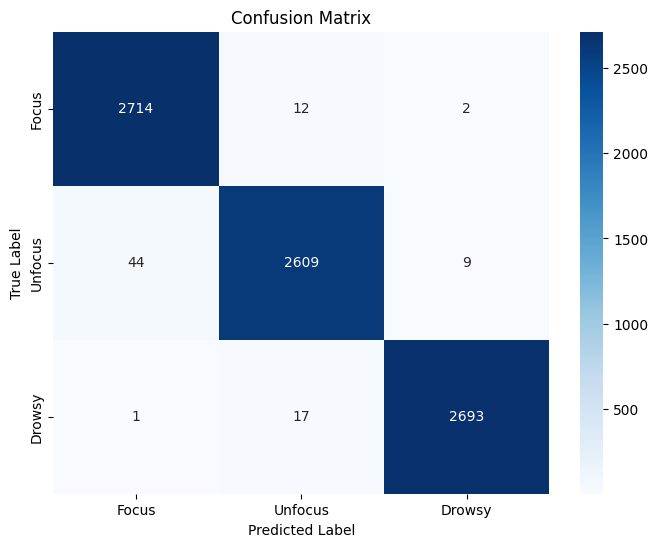

In [ ]:
plot_confusion_matrix(best_rf_model, data_test_scaled, labels_test, target_names=['Focus', 'Unfocus', 'Drowsy'])